In [1]:
!ls

Over the Hill at 24.pdf
Predicting Win:Loss Records using Starcraft 2 Replay Data.pdf
Sentiment analysis of player chat messaging in the video game StarCraft 2- Extending a lexicon-based model.pdf
SkillCraft_version1.ipynb
SkillCraft_version2.ipynb
SkillCraft_version3-Copy1.ipynb
SkillCraft_version3.ipynb
SkillCraft_version_No_Total_Hours.ipynb
SkillCraft_version_Total_Hours.ipynb
SkillCraft_version_Total_Hours_Final.ipynb
StarCraft2ReplayAnalysisDocumentation-1.pdf
Untitled.ipynb
Untitled1.ipynb
Video Game Telemetry as a Critical Tool in the Study of Complex Skill Learning.pdf
starcraft2.csv
개인과제.docx


In [2]:
# Read-in train datasets
train = pd.read_csv("starcraft2.csv")

In [3]:
# Data Exploration & Visualization

# EDA : Data Exploration & Visualization & Outlier

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3395 entries, 0 to 3394
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   GameID              3395 non-null   int64  
 1   LeagueIndex         3395 non-null   int64  
 2   Age                 3340 non-null   float64
 3   HoursPerWeek        3339 non-null   float64
 4   TotalHours          3338 non-null   float64
 5   APM                 3395 non-null   float64
 6   SelectByHotkeys     3395 non-null   float64
 7   AssignToHotkeys     3395 non-null   float64
 8   UniqueHotkeys       3395 non-null   float64
 9   MinimapAttacks      3395 non-null   float64
 10  MinimapRightClicks  3395 non-null   float64
 11  NumberOfPACs        3395 non-null   float64
 12  GapBetweenPACs      3395 non-null   float64
 13  ActionLatency       3395 non-null   float64
 14  ActionsInPAC        3395 non-null   float64
 15  TotalMapExplored    3395 non-null   float64
 16  Worker

In [5]:
# 연속형 변수 전체
train.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,...,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp
count,3395.000000,3395.000000,3340.000000,3339.000000,3338.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,...,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,4805.012371,4.184094,21.647904,15.910752,960.421809,117.046947,0.004299,0.000374,0.000059,0.000098,...,0.003463,40.361562,63.739403,5.272988,0.000283,0.001032,0.000085,0.000059,0.000142,83598.229161
std,2719.944851,1.517327,4.206341,11.962912,17318.133922,51.945291,0.005284,0.000225,0.000038,0.000166,...,0.000992,17.153570,19.238869,1.494835,0.000087,0.000519,0.000025,0.000111,0.000265,33497.667966
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,...,0.000679,6.666700,24.093600,2.038900,0.000091,0.000077,0.000020,0.000000,0.000000,25224.000000
25%,2464.500000,3.000000,19.000000,8.000000,300.000000,79.900200,0.001258,0.000204,0.000033,0.000000,...,0.002754,28.957750,50.446600,4.272850,0.000224,0.000683,0.000068,0.000000,0.000000,60090.000000
50%,4874.000000,4.000000,21.000000,12.000000,500.000000,108.010200,0.002500,0.000353,0.000053,0.000040,...,0.003395,36.723500,60.931800,5.095500,0.000270,0.000905,0.000082,0.000000,0.000020,81012.000000
75%,7108.500000,5.000000,24.000000,20.000000,800.000000,142.790400,0.005133,0.000499,0.000079,0.000119,...,0.004027,48.290500,73.681300,6.033600,0.000325,0.001259,0.000099,0.000086,0.000181,102074.000000
max,10095.000000,8.000000,44.000000,168.000000,1000000.000000,389.831400,0.043088,0.001752,0.000338,0.003019,...,0.007971,237.142900,176.372100,18.558100,0.000832,0.005149,0.000202,0.000902,0.003084,388032.000000


In [6]:
# 연속형 변수만
# 1~10번 변수 까지
train.iloc[:, 0:11].describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks
count,3395.000000,3395.000000,3340.000000,3339.000000,3338.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,4805.012371,4.184094,21.647904,15.910752,960.421809,117.046947,0.004299,0.000374,0.000059,0.000098,0.000387
std,2719.944851,1.517327,4.206341,11.962912,17318.133922,51.945291,0.005284,0.000225,0.000038,0.000166,0.000377
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2464.500000,3.000000,19.000000,8.000000,300.000000,79.900200,0.001258,0.000204,0.000033,0.000000,0.000140
50%,4874.000000,4.000000,21.000000,12.000000,500.000000,108.010200,0.002500,0.000353,0.000053,0.000040,0.000281
75%,7108.500000,5.000000,24.000000,20.000000,800.000000,142.790400,0.005133,0.000499,0.000079,0.000119,0.000514
max,10095.000000,8.000000,44.000000,168.000000,1000000.000000,389.831400,0.043088,0.001752,0.000338,0.003019,0.004041


In [7]:
# PAC 관련
train.iloc[:, 11:15].describe()

,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC
count,3395.000000,3395.000000,3395.000000,3395.000000
mean,0.003463,40.361562,63.739403,5.272988
std,0.000992,17.153570,19.238869,1.494835
min,0.000679,6.666700,24.093600,2.038900
25%,0.002754,28.957750,50.446600,4.272850
50%,0.003395,36.723500,60.931800,5.095500
75%,0.004027,48.290500,73.681300,6.033600
max,0.007971,237.142900,176.372100,18.558100


In [8]:
# 나머지 변수
train.iloc[:, 15:].describe()

,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp
count,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,0.000283,0.001032,0.000085,0.000059,0.000142,83598.229161
std,0.000087,0.000519,0.000025,0.000111,0.000265,33497.667966
min,0.000091,0.000077,0.000020,0.000000,0.000000,25224.000000
25%,0.000224,0.000683,0.000068,0.000000,0.000000,60090.000000
50%,0.000270,0.000905,0.000082,0.000000,0.000020,81012.000000
75%,0.000325,0.001259,0.000099,0.000086,0.000181,102074.000000
max,0.000832,0.005149,0.000202,0.000902,0.003084,388032.000000


## 단위를 Timestamp에서 분으로 변경

In [9]:
train.iloc[:, 6:11]

,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks
0,0.003515,0.000220,0.000055,0.000110,0.000392
1,0.003304,0.000259,0.000069,0.000294,0.000432
2,0.001101,0.000336,0.000042,0.000294,0.000461
3,0.001034,0.000213,0.000011,0.000053,0.000543
4,0.001136,0.000327,0.000039,0.000000,0.001329
...,...,...,...,...,...
3390,0.020425,0.000743,0.000110,0.000621,0.000146
3391,0.028043,0.001157,0.000246,0.000246,0.001083
3392,0.028341,0.000860,0.000108,0.000338,0.000169
3393,0.036436,0.000594,0.000093,0.000204,0.000780


In [10]:
train.iloc[:, 15:20]

,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed
0,0.000220,0.001397,0.000047,0.000000,0.000000
1,0.000381,0.001193,0.000087,0.000000,0.000208
2,0.000231,0.000745,0.000063,0.000000,0.000189
3,0.000202,0.000426,0.000075,0.000000,0.000384
4,0.000289,0.001174,0.000077,0.000000,0.000019
...,...,...,...,...,...
3390,0.000560,0.000877,0.000061,0.000000,0.000000
3391,0.000394,0.000788,0.000098,0.000000,0.000000
3392,0.000292,0.001260,0.000061,0.000000,0.000000
3393,0.000279,0.000613,0.000111,0.000000,0.000631


In [11]:
train.iloc[:, 6:11] = train.iloc[:, 6:11] * 88.5 * 60
train.iloc[:, 15:20] = train.iloc[:, 15:20] * 88.5 * 60

In [12]:
# 단위 변환 후 다시 요약값 통계량 확인
train.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,...,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp
count,3395.000000,3395.000000,3340.000000,3339.000000,3338.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,...,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,4805.012371,4.184094,21.647904,15.910752,960.421809,117.046947,22.825890,1.983687,0.311860,0.522009,...,0.003463,40.361562,63.739403,5.272988,1.500086,5.478248,0.448936,0.315587,0.753374,83598.229161
std,2719.944851,1.517327,4.206341,11.962912,17318.133922,51.945291,28.060310,1.194399,0.203952,0.880776,...,0.000992,17.153570,19.238869,1.494835,0.459835,2.755930,0.131074,0.589891,1.408462,33497.667966
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,...,0.000679,6.666700,24.093600,2.038900,0.484803,0.408870,0.104607,0.000000,0.000000,25224.000000
25%,2464.500000,3.000000,19.000000,8.000000,300.000000,79.900200,6.679014,1.084437,0.173903,0.000000,...,0.002754,28.957750,50.446600,4.272850,1.191373,3.626518,0.360018,0.000000,0.000000,60090.000000
50%,4874.000000,4.000000,21.000000,12.000000,500.000000,108.010200,13.272398,1.872136,0.283554,0.211869,...,0.003395,36.723500,60.931800,5.095500,1.431188,4.806824,0.436482,0.000000,0.107793,81012.000000
75%,7108.500000,5.000000,24.000000,20.000000,800.000000,142.790400,27.253960,2.648811,0.417632,0.631112,...,0.004027,48.290500,73.681300,6.033600,1.727109,6.683431,0.523566,0.454271,0.963075,102074.000000
max,10095.000000,8.000000,44.000000,168.000000,1000000.000000,389.831400,228.799213,9.304129,1.792465,16.032733,...,0.007971,237.142900,176.372100,18.558100,4.417639,27.342783,1.071861,4.791075,16.374447,388032.000000


## Corr Plot & Scatter Plot

<AxesSubplot:title={'center':'Correlation Plot'}>

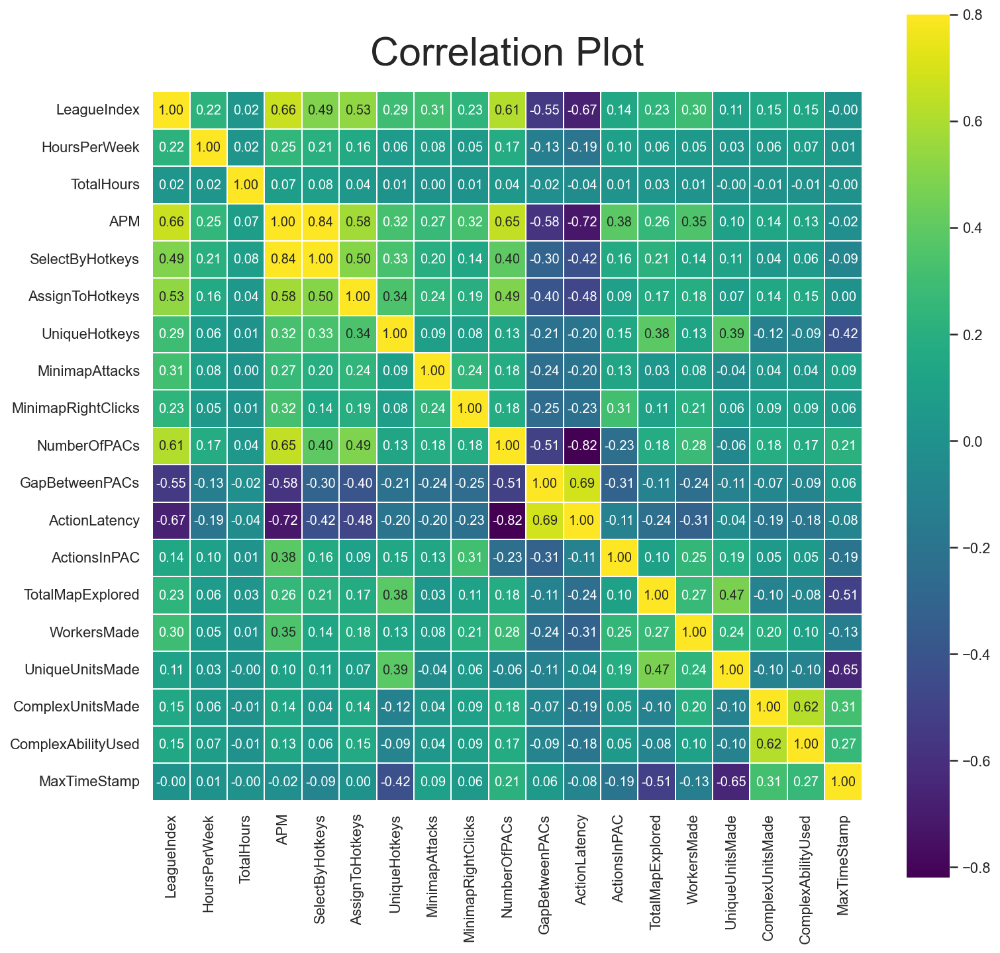

In [13]:
# First check out correlation among numeric features
# Heatmap is a useful tool to get a quick understanding of which variables are important
colormap = plt.cm.viridis
cor = train.corr()
cor = cor.drop(['GameID', 'Age'], axis = 1).drop(['GameID', 'Age'], axis = 0)
plt.figure(figsize=(12, 12))
plt.title('Correlation Plot', fontdict = {'fontsize' : 30}, pad = 20)
sns.heatmap(cor, vmax = 0.8, cmap = colormap, annot=True, fmt = '.2f', square = True, annot_kws={'size':10},
           linecolor='white', linewidths=0.1)

In [14]:
train.columns.to_list

<bound method IndexOpsMixin.tolist of Index(['GameID', 'LeagueIndex', 'Age', 'HoursPerWeek', 'TotalHours', 'APM',
       'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks',
       'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency',
       'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilityUsed', 'MaxTimeStamp'],
      dtype='object')>

/var/folders/72/463csspd3tx0ft106d5pb0zh0000gn/T/ipykernel_76371/754303450.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  pp = sns.pairplot(train.drop(['GameID', 'Age'], 1), hue='LeagueIndex', palette='viridis',


<Figure size 432x288 with 0 Axes>

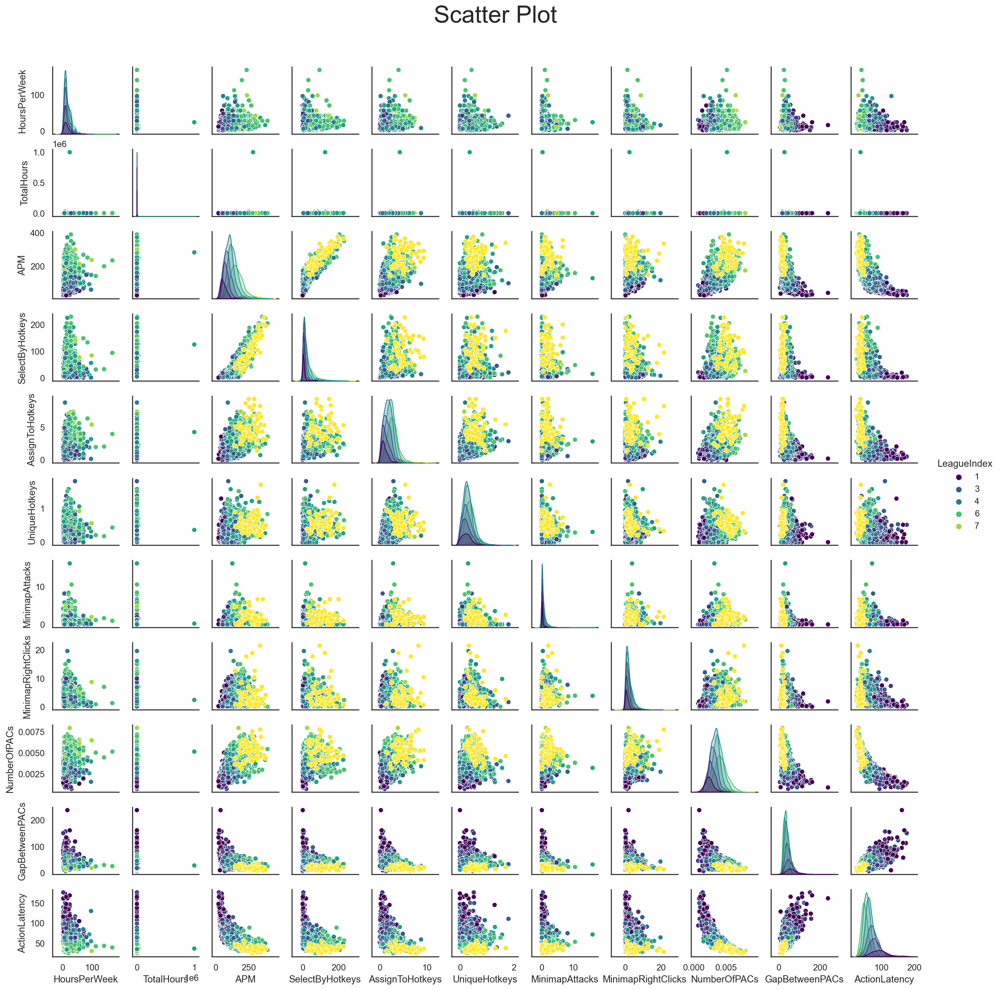

In [15]:
# Next, pair plot some important features
with sns.axes_style('white'):
    plt.suptitle('Scatter Plot')
    pp = sns.pairplot(train.drop(['GameID', 'Age'], 1), hue='LeagueIndex', palette='viridis',
                      vars = ['HoursPerWeek', 'TotalHours', 'APM', 'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks', 'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency'], height = 1.5)
    pp.fig.suptitle("Scatter Plot", fontsize = 30, y=1.05)
    plt.show()

/var/folders/72/463csspd3tx0ft106d5pb0zh0000gn/T/ipykernel_76371/2676231431.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  pp = sns.pairplot(train.drop(['GameID', 'Age'], 1), hue='LeagueIndex', palette='viridis',


<Figure size 432x288 with 0 Axes>

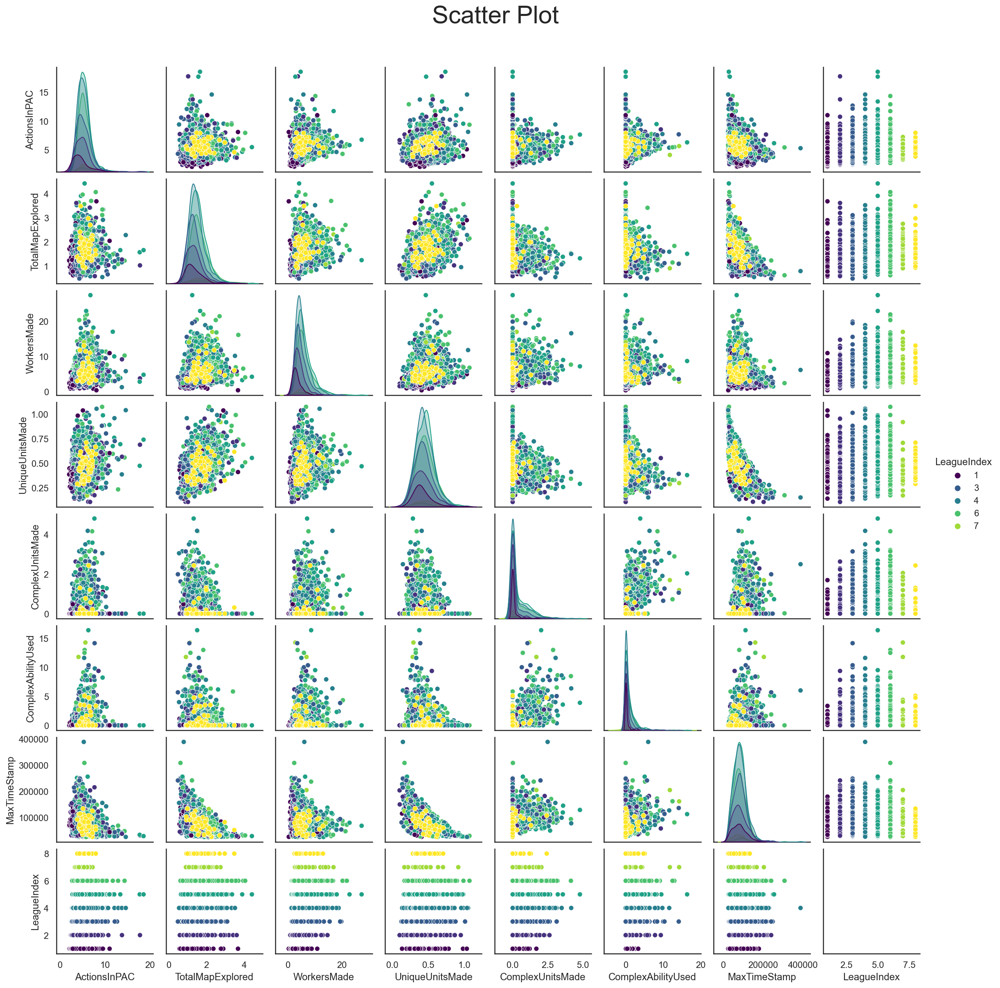

In [16]:
with sns.axes_style('white'):
    plt.suptitle('Scatter Plot')
    pp = sns.pairplot(train.drop(['GameID', 'Age'], 1), hue='LeagueIndex', palette='viridis',
                      vars = ['ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilityUsed', 'MaxTimeStamp', 'LeagueIndex'], height = 2)
    pp.fig.suptitle("Scatter Plot", fontsize = 30, y=1.05)
    plt.show()

## Check VIF

In [17]:
# vif(다중 공선성) 계산
# 결측치를 제거해줍니다.
# LeagueIndex 종속변수는 빼주어야 함

In [18]:
corr_df = train.dropna(axis=0).drop(['GameID', 'Age', 'LeagueIndex'], axis =1)

In [19]:
feature_names = ["scale({})".format(name) for name in corr_df]

feature_names

formula = ' + '.join(feature_names)

formula

from patsy import dmatrix
dfX = dmatrix(formula, corr_df, return_type = "dataframe")

# vif 값을 구합니다.
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

vif["VIF Factor"] = [variance_inflation_factor(dfX.values, i) for i in range(dfX.shape[1])]

vif["features"] = dfX.columns

vif = vif.sort_values("VIF Factor").reset_index(drop = True)

In [20]:
vif

,VIF Factor,features
0,1.000000,Intercept
1,1.008356,scale(TotalHours)
2,1.076999,scale(HoursPerWeek)
3,1.125616,scale(MinimapAttacks)
4,1.290389,scale(MinimapRightClicks)
5,1.434336,scale(WorkersMade)
6,1.488890,scale(UniqueHotkeys)
7,1.611904,scale(AssignToHotkeys)
8,1.681957,scale(ComplexAbilityUsed)
9,1.741917,scale(TotalMapExplored)


In [21]:
# vif가 높은 이유는?
# APM과 상관계수가 높은 변수
# 1. SelectByHotkeys : APM, 1분당 명령횟수가 많아진다는 의미는 단축키의 사용이 많아진다는 의미와 거의 동일하다. 
# 2. AssignToHotkeys : APM이 높을수록 상대적으로 단축키의 할당도 많이진다.
# 3. NumberOfPACs : APM이 높을수록 단위 timestamp동안 PAC 횟수도 많아지게 된다.
# 4. GapBetweenPACs : APM이 높을수록 PAC의 간격이 줄어들게 된다.
# 5. ActionLatency : APM이 높을수록 PAC의 첫 번째 행동까지의 기간은 줄어들게 된다.
# 따라서 vif가 10이 넘는 변수 중 SelectByHotkeys와 NumberOfPACs를 제거하고 다시 vif를 확인하자.

In [22]:
corr_revison_df = train.dropna(axis=0).drop(['GameID', 'Age', 'LeagueIndex', 'SelectByHotkeys', 'NumberOfPACs'], axis =1)

In [23]:
feature_names = ["scale({})".format(name) for name in corr_revison_df]

feature_names

formula = ' + '.join(feature_names)

formula

from patsy import dmatrix
dfX = dmatrix(formula, corr_revison_df, return_type = "dataframe")

# vif 값을 구합니다.
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

vif["VIF Factor"] = [variance_inflation_factor(dfX.values, i) for i in range(dfX.shape[1])]

vif["features"] = dfX.columns

vif = vif.sort_values("VIF Factor").reset_index(drop = True)

In [24]:
vif

,VIF Factor,features
0,1.000000,Intercept
1,1.008084,scale(TotalHours)
2,1.073893,scale(HoursPerWeek)
3,1.124224,scale(MinimapAttacks)
4,1.246872,scale(MinimapRightClicks)
5,1.329110,scale(WorkersMade)
6,1.486254,scale(UniqueHotkeys)
7,1.590969,scale(AssignToHotkeys)
8,1.623923,scale(ActionsInPAC)
9,1.671671,scale(ComplexAbilityUsed)


In [25]:
# vif 분석 완료

## Selection Variable

#### 21개의 변수 중 4개의 변수 제외 : 'GameID',  'Age', 'SelectByHotkeys', 'NumberOfPACs'

In [26]:
train_df = train.copy()

In [27]:
train_df.drop(['GameID',  'Age', 'SelectByHotkeys', 'NumberOfPACs'], axis = 1, inplace=True)

In [28]:
train_df

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp
0,5,10.0,3000.0,143.7180,1.166591,0.291519,0.583298,2.083203,32.6677,40.8673,4.7508,1.166591,7.415946,0.250101,0.000000,0.000000,127448
1,5,10.0,5000.0,129.2322,1.377743,0.367452,1.561443,2.296235,32.9194,42.3454,4.8434,2.020689,6.337485,0.459315,0.000000,1.102197,57812
2,4,10.0,200.0,69.9612,1.781877,0.222489,1.559143,2.450082,44.6475,75.3548,4.0430,1.225044,3.953561,0.333999,0.000000,1.002316,95360
3,3,20.0,400.0,107.6016,1.131566,0.056817,0.283023,2.885502,29.2203,53.7352,4.9155,1.074988,2.263122,0.396126,0.000000,2.036810,93852
4,3,10.0,500.0,122.8908,1.738101,0.204435,0.000000,7.054643,22.6885,62.0813,9.3740,1.533618,6.236595,0.408870,0.000000,0.102483,51936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,8,NaN,NaN,259.6296,3.945118,0.582066,3.298376,0.776088,18.6059,42.8342,6.2754,2.975007,4.656551,0.323379,0.000000,0.000000,82104
3391,8,NaN,NaN,314.6700,6.144620,1.307364,1.307364,5.752413,14.3023,36.1156,7.1965,2.091784,4.183590,0.523035,0.000000,0.000000,40616
3392,8,NaN,NaN,299.4282,4.567742,0.570968,1.794472,0.897236,12.4028,39.5156,6.3979,1.549771,6.688476,0.326034,0.000000,0.000000,65100
3393,8,NaN,NaN,375.8664,3.155547,0.493299,1.084721,4.141657,11.6910,34.8547,7.9615,1.479164,3.254180,0.591667,0.000000,3.352787,53848


## Dependent variable : LeagueIndex

In [29]:
# 평균을 구하기 위한 트릭
train_df['num'] = 1

Total_LeagueIndex = train_df.groupby(train_df.LeagueIndex).count().num.sum()

Total_LeagueIndex

train_League_df = train_df.groupby(train_df.LeagueIndex).count()

train_League_df['num_mean']= train_League_df.num/Total_LeagueIndex

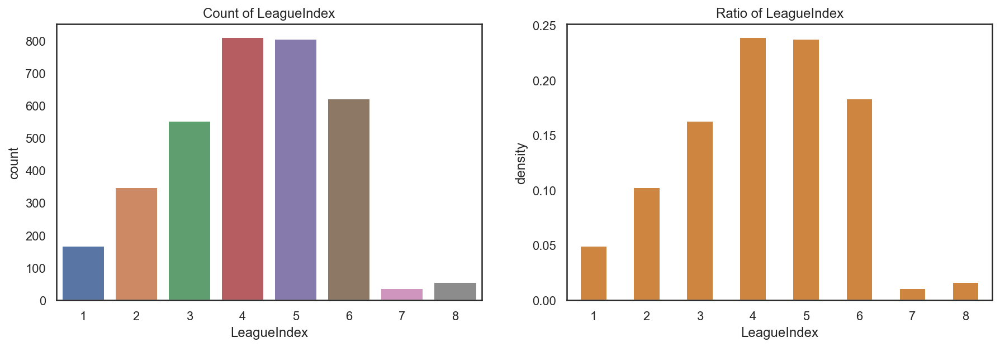

In [30]:
# 수준에 대하여 그룹화 할 것이므로 LeaguIndex 부터 일변수 분석을 실시
# 일변수 분석을 위한 그래프
# 1. 히스토그램(범주형)
plt.figure(figsize = (15, 10))
with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.countplot(x="LeagueIndex", data = train_df)
    plt.title("Count of LeagueIndex")
    
    
    plt.subplot(2,2,2)
    train_League_df['num_mean'].plot.bar(rot = 0, color = 'peru')
    plt.title("Ratio of LeagueIndex")
    plt.ylabel('density')

In [31]:
train_df.groupby(train_df.LeagueIndex).mean()

,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,num
LeagueIndex,,,,,,,,,,,,,,,,,
1,13.125749,264.191617,59.539277,0.984853,0.240372,0.150163,1.105369,65.654987,95.404977,4.548287,1.330256,3.326479,0.417210,0.077840,0.221685,80558.586826,1.0
2,13.296830,331.409222,74.780917,1.178690,0.238625,0.236698,1.463096,53.788886,81.270053,5.005949,1.362332,4.253903,0.424725,0.129303,0.401499,84271.573487,1.0
3,13.949367,493.792043,89.971260,1.496779,0.262449,0.297433,1.762206,46.143882,73.697301,5.163282,1.376833,4.878202,0.434394,0.238992,0.620527,84287.949367,1.0
4,14.022195,588.006165,105.847166,1.805923,0.279128,0.396993,1.953677,41.041426,64.793765,5.236971,1.473330,5.341650,0.447559,0.344977,0.733949,84594.609125,1.0
5,16.183851,2024.493781,131.520718,2.200588,0.337261,0.610756,2.262944,34.726473,56.085007,5.468031,1.573149,6.200634,0.462822,0.401311,0.935404,82298.089330,1.0
6,21.088567,988.405797,158.683211,2.716549,0.395352,0.826336,2.513140,30.207895,48.947837,5.475560,1.644112,6.432927,0.468494,0.411121,0.965914,83879.658615,1.0
7,31.714286,1581.028571,189.555686,3.841252,0.423691,1.807974,3.028797,22.978160,40.342903,5.226089,1.662020,6.575438,0.420361,0.434254,1.419334,96742.171429,1.0
8,NaN,NaN,267.341236,4.976792,0.584332,1.997550,4.412028,18.969773,35.390153,5.676727,1.718719,5.720044,0.458409,0.139104,0.718779,74463.636364,1.0


### Group By LeagueIndex : 1(Bronze), 2(Silver), 3(Gold) = 0 (초보), 4(Platinum), 5(Diamond) = 1 (중수), 6(Master), <br><br>7(Grand Master), 8(Professional) = 2 (전문가)

In [32]:
def LeagueFunction(x):
    if x <= 3:
        return 0
    elif (x >= 4 and x <= 5):
        return 1
    else:
        return 2

In [33]:
train_df['LeagueLevel'] = train_df['LeagueIndex'].apply(LeagueFunction)

In [34]:
train_df['LeagueLevel'].describe()

count    3395.000000
mean        0.895140
std         0.716147
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: LeagueLevel, dtype: float64

In [35]:
# 평균을 구하기 위한 트릭
train_df['num'] = 1

Total_LeagueIndex = train_df.groupby(train_df.LeagueLevel).count().num.sum()

Total_LeagueIndex

train_League_df = train_df.groupby(train_df.LeagueLevel).count()

train_League_df['num_mean']= train_League_df.num/Total_LeagueIndex

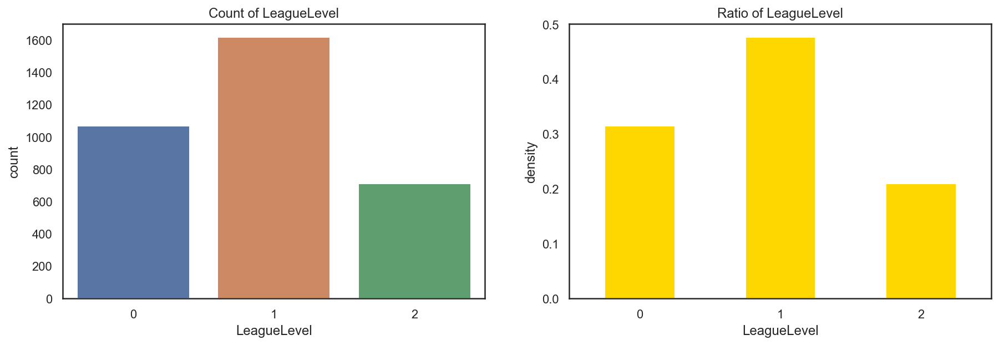

In [36]:
plt.figure(figsize = (15, 10))
with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.countplot(x="LeagueLevel", data = train_df)
    plt.title("Count of LeagueLevel")
    
    plt.subplot(2,2,2)
    train_League_df['num_mean'].plot.bar(rot = 0, color = 'gold')
    plt.title("Ratio of LeagueLevel")
    plt.ylabel('density')

In [37]:
train_df.drop(['num'], axis = 1, inplace=True)

In [38]:
train_df.groupby(train_df.LeagueLevel).mean().T

LeagueLevel,0,1,2
LeagueIndex,2.361762,4.498454,6.203938
HoursPerWeek,13.608247,15.099010,21.655488
TotalHours,405.047798,1303.136842,1020.024390
APM,80.268176,118.644249,168.608286
AssignToHotkeys,1.313209,2.002645,2.946757
UniqueHotkeys,0.251246,0.308105,0.411366
MinimapAttacks,0.254631,0.503544,0.965258
MinimapRightClicks,1.562128,2.107832,2.685414
GapBetweenPACs,51.683874,37.893713,28.982666
ActionLatency,79.557588,60.452850,47.475481


## HoursPerWeek

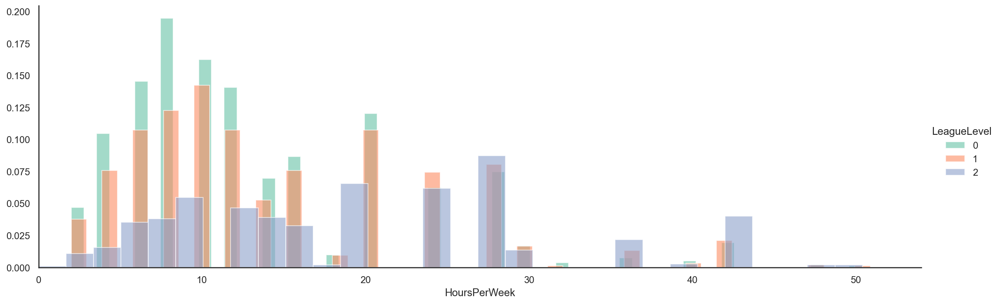

In [39]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'HoursPerWeek',bins=100,alpha=0.6, density = True)
    facet.set(xlim=(0,train.Age.max()+10))
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


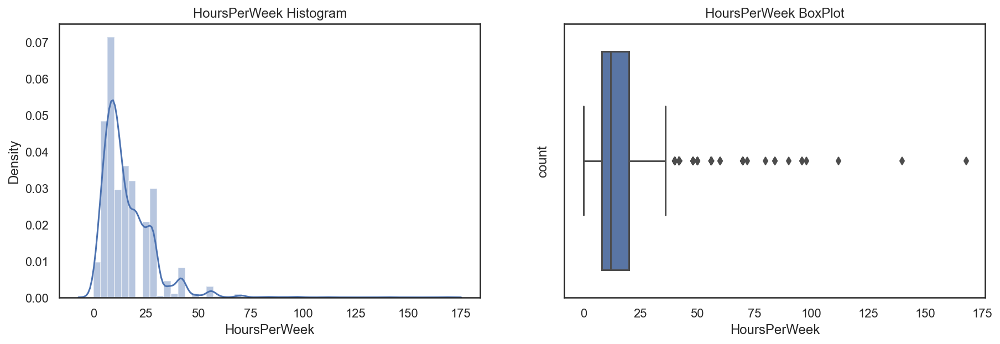

In [40]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    plt.title("HoursPerWeek Histogram")
    sns.distplot(train_df['HoursPerWeek'])
    
    plt.subplot(2,2,2)
    plt.title("HoursPerWeek BoxPlot")
    sns.boxplot(train_df['HoursPerWeek'])
    plt.ylabel('count')

In [41]:
# 프로게이머 기준 평균 하루 14시간으로 정하여 100시간 이상은 이상치로 간주
idx = train_df[train['HoursPerWeek'] >= 100].index
len(idx)

3

In [42]:
train_df.drop(idx, inplace=True)

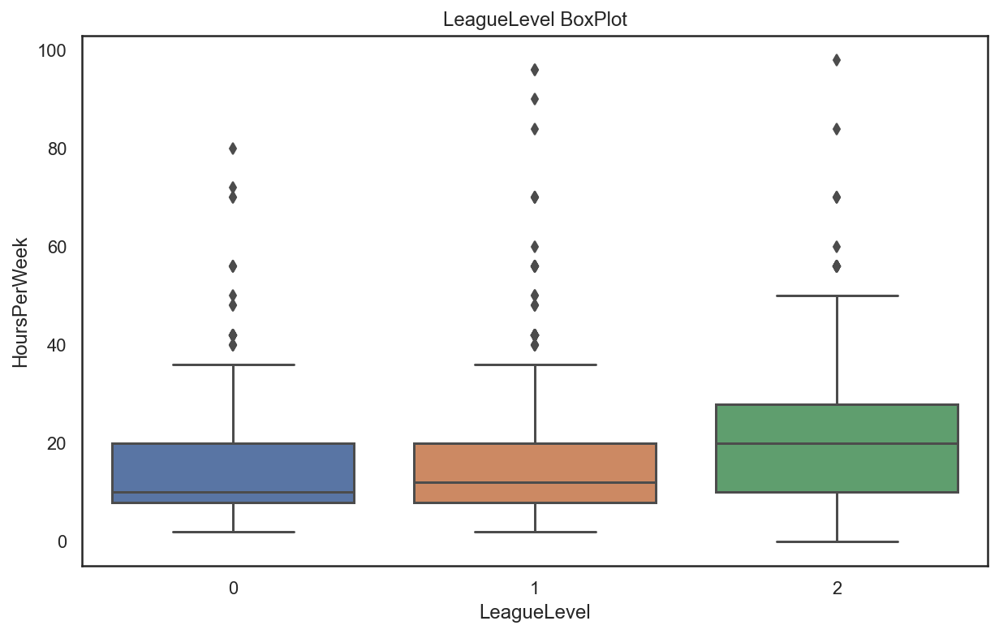

In [43]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'HoursPerWeek', data = train_df)

In [44]:
# 극단값 제거

In [45]:
# 수준0 하루 6시간 * 7 = 42
train_df[train_df['LeagueLevel'] == 0].sort_values(by='HoursPerWeek',ascending=False).head(5)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2159,3,80.0,200.0,146.5200,2.087058,0.521973,0.260721,0.782646,35.4872,64.8136,7.3983,1.434852,2.347923,0.391347,0.0,0.000000,40708,0
1050,2,72.0,144.0,74.5200,0.884094,0.339840,0.000000,0.544057,56.4400,80.0995,4.9502,0.884094,3.332344,0.407808,0.0,0.203904,78080,0
757,2,70.0,1000.0,87.9894,1.052261,0.300546,0.075402,2.630648,31.9606,66.6471,5.1422,1.202582,5.561694,0.450819,0.0,0.000000,70648,0
440,1,70.0,400.0,82.0902,0.339840,0.056817,0.056817,0.566338,50.0444,71.9779,8.1215,0.962777,1.868908,0.339840,0.0,0.000000,93760,0
3268,3,56.0,800.0,127.2270,0.799219,0.240012,0.879140,0.799219,50.2857,82.2955,5.3920,1.838200,5.914278,0.479493,0.0,0.000000,66440,0


In [46]:
# 수준 1 하루 8시간 * 7 = 56
train_df[train_df['LeagueLevel'] == 1].sort_values(by='HoursPerWeek',ascending=False).head(5)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
237,5,96.0,900.0,145.8060,3.165801,0.316476,0.000000,0.158238,43.2906,54.4060,4.3008,1.662046,5.381685,0.633159,0.000000,0.553992,67092,1
2662,4,96.0,400.0,56.8584,0.156114,0.156114,0.156114,1.405918,47.6078,129.8462,6.9038,1.718348,4.061566,0.781064,0.000000,0.000000,33992,1
1299,5,90.0,1000.0,89.6652,1.911388,0.415773,0.914143,1.578971,37.2099,71.6074,5.8834,1.080351,5.235554,0.415773,0.498609,0.166203,63896,1
1796,4,84.0,640.0,149.6574,2.765623,0.184257,0.000000,0.245853,29.0142,46.9886,5.9886,1.659375,7.313463,0.368514,1.290627,5.346639,86400,1
1438,5,70.0,1400.0,100.0374,0.952433,0.148149,0.867771,2.095353,47.7645,55.8558,3.7723,0.740782,1.481543,0.169389,0.000000,0.000000,250884,1


In [47]:
idx1 = train_df[(train_df['LeagueLevel'] == 0) & (train_df['HoursPerWeek'] > 42)].index

In [48]:
idx2 = train_df[(train_df['LeagueLevel'] == 1) & (train_df['HoursPerWeek'] > 56)].index

In [49]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

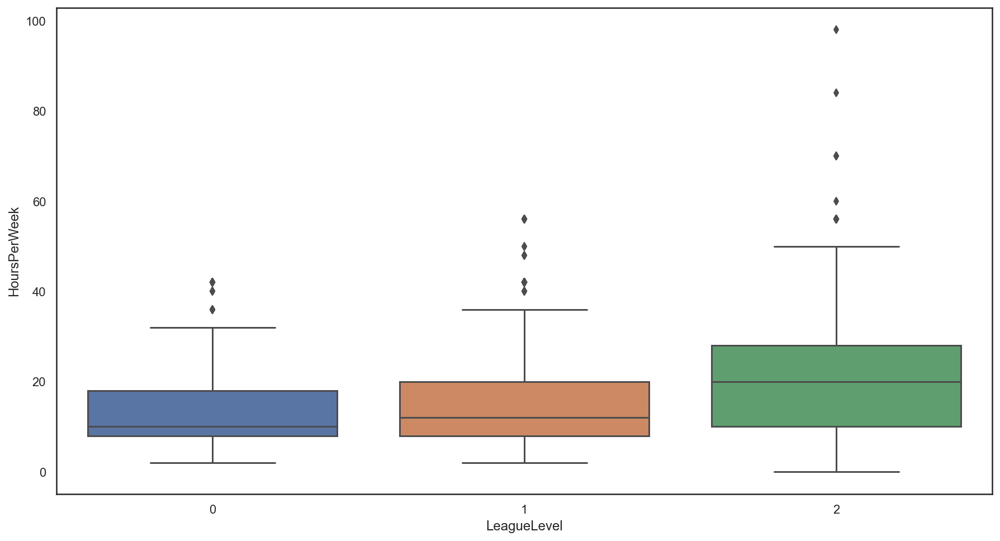

In [50]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'HoursPerWeek', data = train_df)

## TotalHours

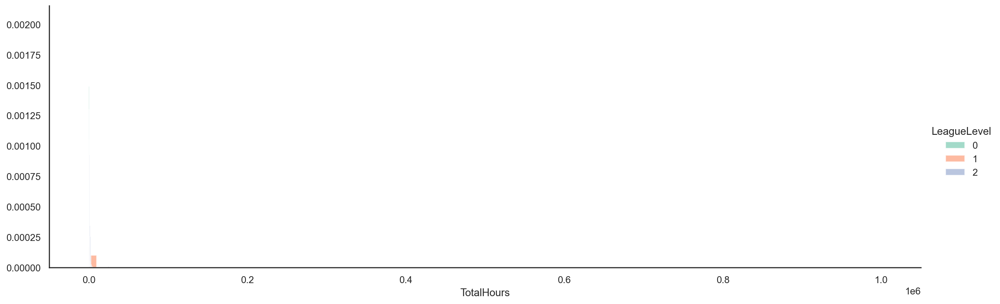

In [51]:
# 말이 안되는 범위인데
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'TotalHours',bins=100,alpha=0.6, density = True)
    facet.add_legend()

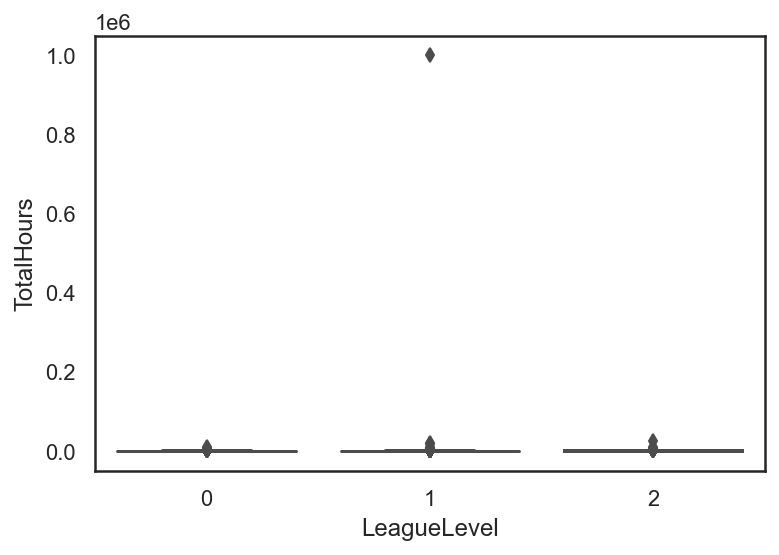

In [52]:
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'TotalHours', data = train_df)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


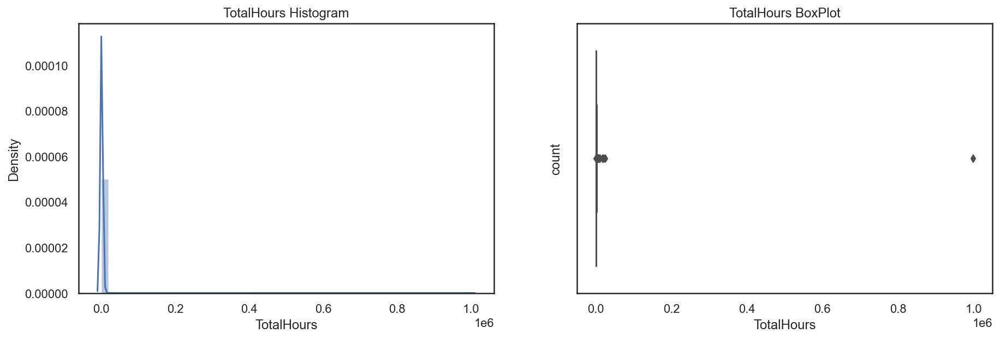

In [53]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    plt.title("TotalHours Histogram")
    sns.distplot(train_df['TotalHours'])
    
    plt.subplot(2,2,2)
    plt.title("TotalHours BoxPlot")
    sns.boxplot(train_df['TotalHours'])
    plt.ylabel('count')

In [54]:
# 극단값 제거하고 다시 분석

In [55]:
train['TotalHours'].describe()

count       3338.000000
mean         960.421809
std        17318.133922
min            3.000000
25%          300.000000
50%          500.000000
75%          800.000000
max      1000000.000000
Name: TotalHours, dtype: float64

In [56]:
# 쓸데없이 제일 큰 값 제거

In [57]:
idx = train_df[train_df['TotalHours'] >= 1000000].index

In [58]:
train_df.drop(idx, inplace=True)

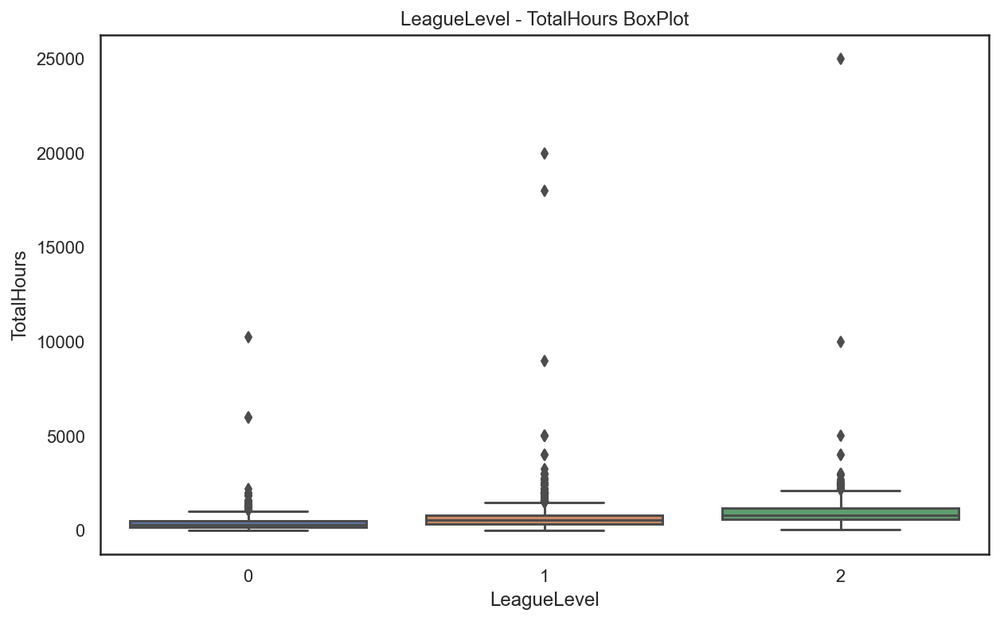

In [59]:
with sns.axes_style('white'):
    plt.figure(figsize = (10, 6))
    plt.title("LeagueLevel - TotalHours BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'TotalHours', data = train_df)

In [60]:
# 수준별 극단값 제거 (내림차순으로 정렬)
# 수준 0 : 5000시간 (하루 10시간으로 기준하면 500일)
# 수준 1 : 상위 3개
# 수준 2 : 상위 3개

In [61]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='TotalHours',ascending=False).head(4)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2216,3,20.0,10260.0,76.5852,1.044482,0.000000,0.335592,1.678634,42.9480,84.6340,5.9107,1.007180,2.387376,0.373293,1.305602,1.902467,142348,0
10,3,16.0,6000.0,153.8010,1.691538,0.356301,0.000000,4.362383,23.4107,48.0711,7.0044,2.136675,8.457768,0.623198,0.000000,0.089208,59644,0
3253,3,20.0,6000.0,102.0114,1.685118,0.234171,0.234171,2.948962,62.5423,67.3140,6.3605,1.123415,7.489224,0.280899,1.263838,10.344942,113440,0
2050,3,30.0,2200.0,86.1066,0.989869,0.247446,0.165141,4.371930,49.7679,61.3511,4.3644,1.979743,4.041972,0.329751,0.000000,0.000000,64372,0


In [62]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='TotalHours',ascending=False).head(4)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
770,5,16.0,20000.0,248.0490,2.074681,0.691558,0.000000,1.086739,37.8795,45.3760,4.7560,2.074681,8.100936,0.592766,0.0,0.000000,53748,1
1978,4,10.0,18000.0,152.2374,1.091279,0.083898,0.083898,1.930727,52.1896,63.9811,4.9575,1.594949,3.609632,0.419490,0.0,0.000000,63256,1
2140,5,10.0,9000.0,106.0056,3.370422,0.508698,5.023833,3.052453,28.6645,55.9603,4.6159,1.589819,5.405580,0.508698,0.0,0.826714,83500,1
1,5,10.0,5000.0,129.2322,1.377743,0.367452,1.561443,2.296235,32.9194,42.3454,4.8434,2.020689,6.337485,0.459315,0.0,1.102197,57812,1


In [63]:
# 수준 0
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='TotalHours',ascending=False).head(3).index

In [64]:
# 수준 1
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='TotalHours',ascending=False).head(3).index

In [65]:
# 수준 2
idx3 = train_df[train_df['LeagueLevel'] == 2].sort_values(by='TotalHours',ascending=False).head(1).index

In [66]:
train_df[train_df['LeagueLevel'] == 2].sort_values(by='TotalHours',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2324,6,8.0,25000.0,247.0164,2.327846,0.503388,1.635783,7.109363,17.6471,37.1837,6.5944,1.824527,9.877662,0.377541,0.000000,0.062658,84400,2
7,7,42.0,10000.0,212.6022,3.590834,0.317007,6.178350,6.653605,24.6117,41.7671,6.6104,2.376289,12.092463,0.475245,0.686482,1.320172,100556,2


In [67]:
# Grand Master
train_df[train_df['LeagueIndex'] == 7].sort_values(by='TotalHours',ascending=False).head(10)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
7,7,42.0,10000.0,212.6022,3.590834,0.317007,6.178350,6.653605,24.6117,41.7671,6.6104,2.376289,12.092463,0.475245,0.686482,1.320172,100556,2
2271,7,56.0,3000.0,169.6974,2.745504,0.294174,0.637349,2.108155,25.5613,35.2326,4.3308,1.470806,7.206732,0.343026,1.715937,2.353286,108308,2
2901,7,28.0,2700.0,179.7546,3.093935,0.321255,4.701177,2.330501,24.1628,40.1626,5.3062,2.129591,3.294855,0.321255,0.000000,0.000000,132152,2
1787,7,56.0,2500.0,213.6318,4.469523,0.182133,0.857523,2.078849,30.5893,35.2771,4.1092,0.909497,6.964065,0.285678,1.689063,11.771739,204344,2
1853,7,28.0,2500.0,185.3424,4.873183,0.276651,1.993576,0.719903,28.0093,44.2593,5.3333,1.716691,4.264036,0.332406,2.048954,1.273657,95888,2
2594,7,56.0,2400.0,171.7614,3.489870,0.263376,0.954775,5.037262,23.7598,37.6891,5.6487,1.119390,2.831398,0.296298,1.185240,14.255757,161284,2
320,7,42.0,2400.0,182.6208,1.644560,0.453474,1.077468,3.515953,24.4969,38.6260,5.4065,1.020763,6.181371,0.397188,0.000000,0.000000,93636,2
713,7,56.0,2400.0,136.2432,4.541813,0.516132,0.051613,0.980619,28.0987,39.9318,4.0322,1.703183,5.935518,0.516132,0.567729,4.386963,102884,2
3127,7,42.0,2000.0,298.7952,2.000250,0.533400,0.133281,0.133281,16.8586,33.7292,6.1354,1.866900,5.067280,0.533400,0.000000,0.000000,39820,2
1597,7,42.0,2000.0,210.2112,6.479235,0.637301,1.274602,4.567333,18.3597,34.0358,5.4122,2.549209,14.976855,0.637301,0.000000,0.212400,49992,2


In [68]:
# 위에 해당하는 값들은 모두 이상치로 제거해야 함
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)
train_df.drop(idx3, inplace=True)

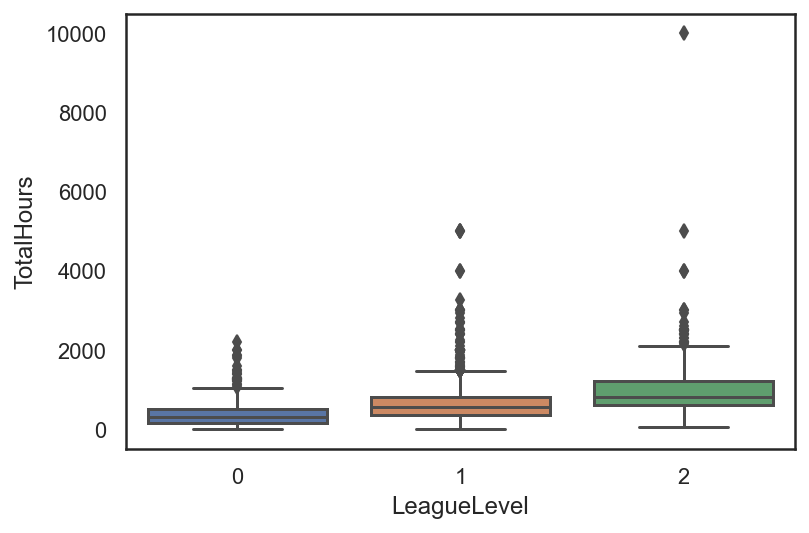

In [69]:
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'TotalHours', data = train_df)

In [70]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='TotalHours',ascending=False).head(5)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
1,5,10.0,5000.0,129.2322,1.377743,0.367452,1.561443,2.296235,32.9194,42.3454,4.8434,2.020689,6.337485,0.459315,0.000000,1.102197,57812,1
14,5,30.0,5000.0,160.4754,2.292513,0.134874,4.113041,2.157660,36.2897,46.8889,5.4361,1.887955,10.518579,0.472059,0.000000,0.000000,78752,1
338,5,40.0,5000.0,84.7086,0.441261,0.088146,1.279540,2.117856,48.5120,62.6064,4.5585,1.103052,6.662457,0.309042,0.220365,1.588380,120348,1
289,4,28.0,4000.0,194.1858,2.672900,0.248508,1.305373,1.740496,39.8389,41.0591,4.6454,1.367532,4.910688,0.372762,1.864814,0.745949,85424,1
2426,5,8.0,4000.0,133.4052,0.963850,0.183726,1.835911,1.285137,32.1961,44.4775,5.6047,1.101544,5.461866,0.413118,1.881806,4.819250,115692,1


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


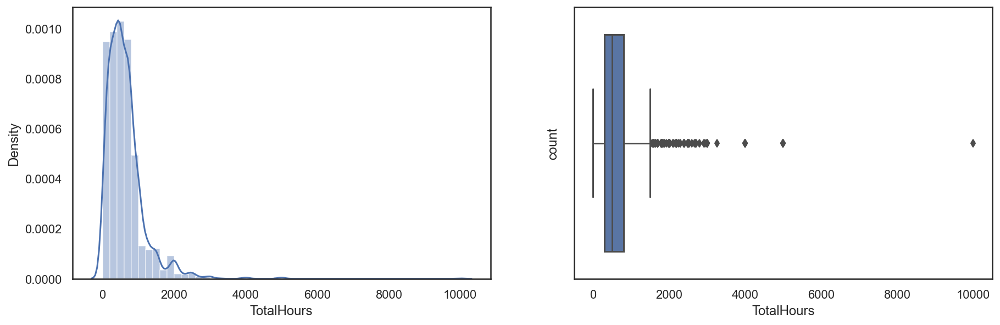

In [71]:
# 가장 극단치 Grand Master라서 제거하지 않았음
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['TotalHours'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['TotalHours'])
    plt.ylabel('count')

### TotalHours 보다 HoursPerWeek가 큰 경우는 아직 반영이 되지 않은 부분이라고 판단하였음

In [72]:
train_df[train_df['HoursPerWeek'] > train_df['TotalHours']]

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
184,2,12.0,10.0,44.5248,0.805113,0.000000,0.268155,0.670929,66.3500,97.9259,3.3580,1.476042,3.220462,0.402498,0.0,0.000000,39572,0
976,3,28.0,3.0,69.5748,1.968454,0.190629,0.000000,1.269971,57.3775,69.4389,3.3234,1.142972,2.920925,0.444447,0.0,2.603440,83624,0
1244,3,42.0,30.0,95.6886,2.867947,1.792465,0.000000,1.613220,33.1064,110.3333,8.0833,1.254726,4.122684,0.716988,0.0,0.000000,29624,0
1865,1,20.0,16.0,73.2594,0.723827,0.329220,0.000000,0.526221,52.8103,69.4359,3.2981,1.381853,3.684928,0.395064,0.0,0.000000,80696,0
2799,2,20.0,12.0,57.1536,1.764433,0.294174,0.058941,1.411547,61.4216,81.3611,3.0174,0.999846,4.587521,0.411525,0.0,0.294174,90284,0
2946,1,28.0,20.0,91.2876,2.885406,0.748067,0.000000,0.427455,22.0000,59.4126,4.9371,1.496135,4.809001,0.641204,0.0,0.427455,49688,0


## APM

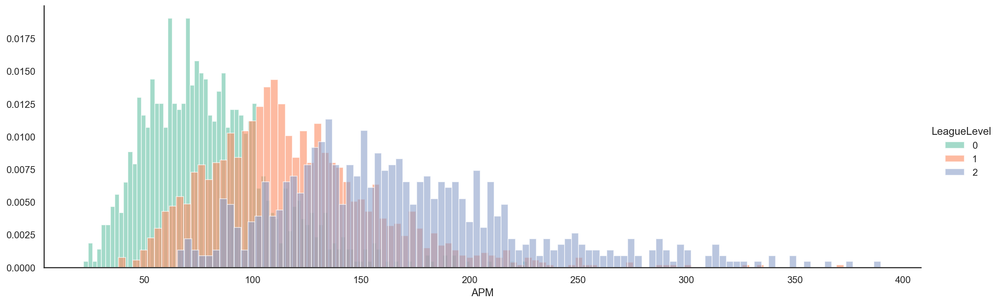

In [73]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'APM',bins=100,alpha=0.6, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


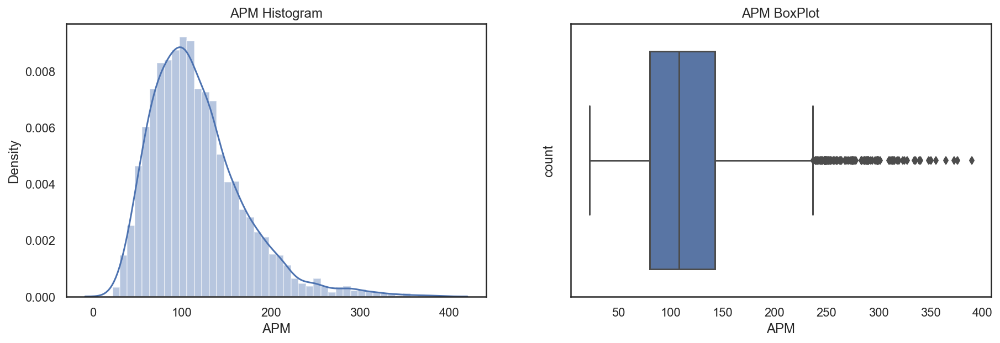

In [74]:
# APM

plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    plt.title("APM Histogram")
    sns.distplot(train_df['APM'])
    
    plt.subplot(2,2,2)
    plt.title("APM BoxPlot")
    sns.boxplot(train_df['APM'])
    plt.ylabel('count')

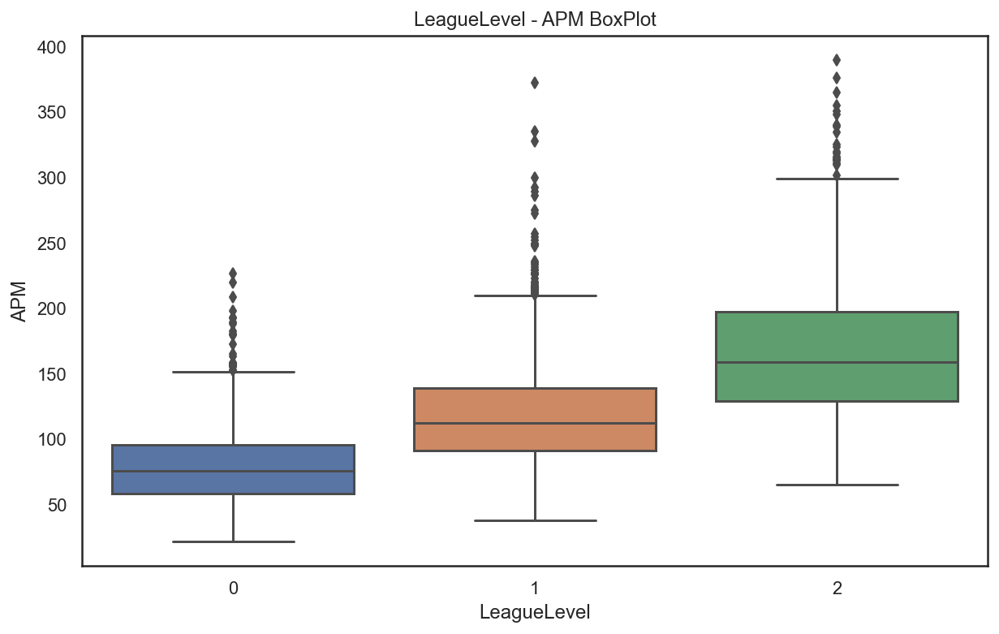

In [75]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - APM BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'APM', data = train_df)

In [76]:
# 스타2 프로 기준 APM 300이므로 300이 넘는 APM에 대해서 수준1을 이상값으로 판단하였음
train_df[train_df['LeagueLevel'] == 1].sort_values(by='APM',ascending=False).head(10)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
3277,5,16.0,950.0,372.6426,2.487916,0.261783,0.043648,0.392940,33.2198,48.9565,6.6067,0.829305,3.884637,0.218241,0.480024,0.611075,121656,1
93,5,36.0,720.0,335.4990,0.729360,0.151866,0.060534,2.218476,24.2551,43.0048,5.7007,0.850922,3.008593,0.334530,0.000000,0.000000,174728,1
202,5,14.0,800.0,327.7218,2.957012,1.182802,0.000000,1.577070,29.3671,54.1000,9.5375,2.562739,5.716746,0.985669,0.000000,0.000000,26936,1
2956,5,10.0,2000.0,299.9994,3.907114,0.306387,0.000000,1.225760,54.2767,51.5748,5.7756,2.221693,12.640455,0.536273,0.919320,0.689504,69312,1
1368,5,16.0,1000.0,292.5408,2.081807,0.267093,0.053631,1.761529,14.4179,30.7593,9.4690,1.441251,5.658336,0.480555,1.334493,8.220411,99476,1
2318,5,28.0,850.0,289.4268,3.672311,0.407808,2.366603,1.550531,31.2613,56.3767,7.6368,1.224104,9.466668,0.489582,0.000000,0.000000,65068,1
2976,5,10.0,500.0,286.2444,2.098613,0.419490,0.419490,0.839447,23.9155,33.2632,7.8982,1.678895,9.065763,0.503919,0.839447,2.350472,63256,1
2065,5,8.0,280.0,274.9086,4.846230,0.587424,0.220365,0.734277,18.4295,42.8495,6.3344,1.321701,4.552529,0.587424,1.909120,0.000000,72316,1
1760,5,10.0,200.0,272.8404,2.218550,1.210117,0.000000,4.033731,29.4359,60.6076,7.7595,1.815176,4.638763,0.605059,0.000000,0.000000,26328,1
1340,5,24.0,800.0,256.8528,3.214493,0.347274,0.000000,4.257038,15.3896,34.9773,6.2298,2.171955,8.861328,0.434358,0.000000,0.000000,61120,1


In [77]:
idx = train_df[train_df['LeagueLevel'] == 1].sort_values(by='APM',ascending=False).head(3).index

In [78]:
train_df.drop(idx, inplace=True)

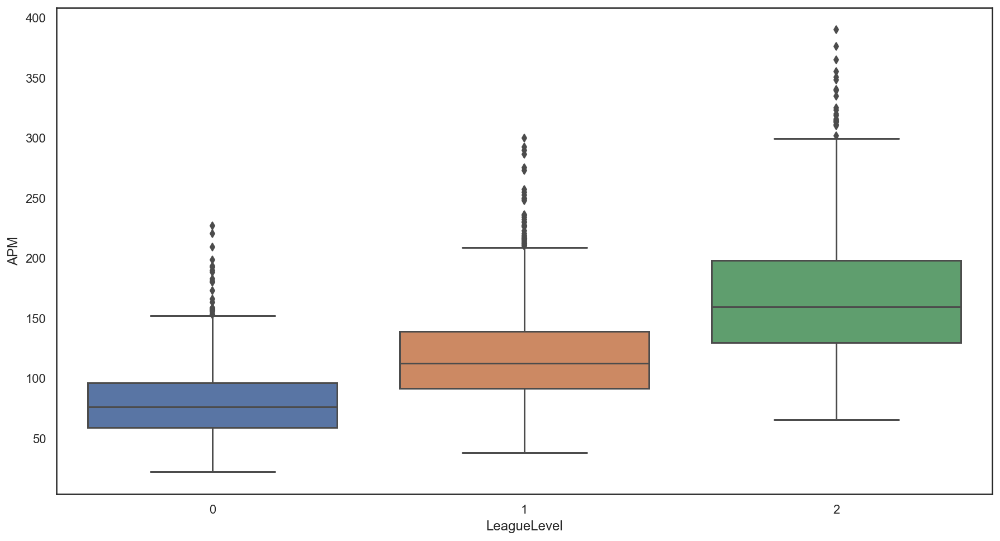

In [79]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'APM', data = train_df)

In [80]:
# APM이 1000 이상 되는 값이 없음, 프로게이머 수준 250~350이며 400 근처 까지 APM은 나올 수 있음

## AssignToHotkeys

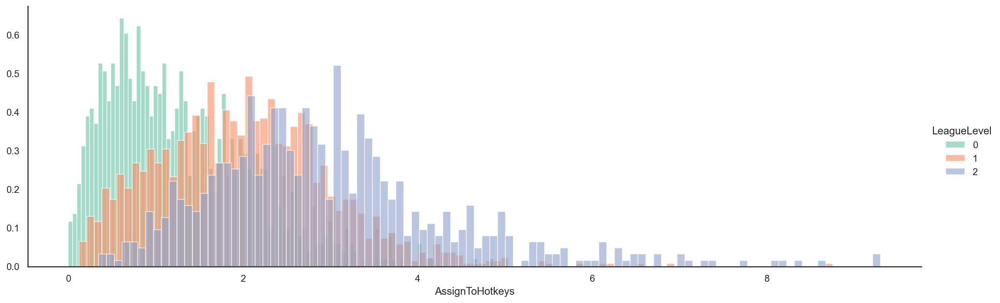

In [81]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'AssignToHotkeys',bins=100,alpha=0.6, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


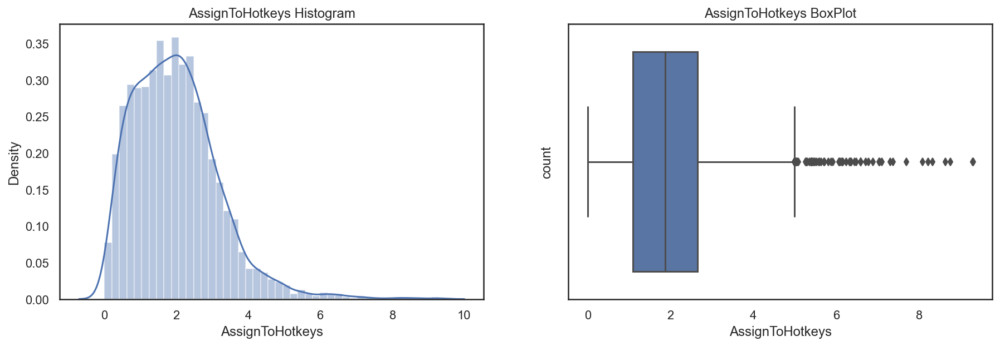

In [82]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    plt.title("AssignToHotkeys Histogram")
    sns.distplot(train_df['AssignToHotkeys'])
    
    plt.subplot(2,2,2)
    plt.title("AssignToHotkeys BoxPlot")
    sns.boxplot(train_df['AssignToHotkeys'])
    plt.ylabel('count')

In [83]:
train_df[train_df['LeagueLevel'] == 2].sort_values(by='AssignToHotkeys',ascending=False)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
3349,8,NaN,NaN,248.0118,9.304129,0.581509,1.993740,0.581509,17.4656,34.2357,7.8973,1.661451,5.898348,0.664578,0.000000,0.000000,63920,2
3354,8,NaN,NaN,290.5914,9.290206,0.352584,0.117351,10.348585,22.0126,36.0669,4.9540,1.117176,3.410348,0.352584,0.235233,0.411525,90308,2
3384,8,NaN,NaN,225.0678,8.638966,0.451350,1.547276,4.835244,16.3502,33.2874,5.4713,1.676218,4.770770,0.515601,0.000000,5.093140,82364,2
3378,8,NaN,NaN,288.9198,8.331592,0.537521,0.627111,1.164632,23.2857,32.8026,4.7540,2.150088,6.002424,0.448164,0.000000,0.000000,59272,2
3362,8,NaN,NaN,334.5240,8.218616,0.330813,2.040867,21.456664,13.5401,28.2243,5.6862,1.599595,11.472786,0.496485,0.772217,0.386037,96268,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,6,12.0,500.0,130.9860,0.599972,0.480024,1.079953,2.519887,22.6040,43.7600,6.7600,1.799920,5.759757,0.480024,0.000000,1.919937,44252,2
2754,6,24.0,1800.0,159.3240,0.487458,0.243729,0.914132,6.886449,21.6201,44.3454,6.4178,1.401665,8.348913,0.548481,0.731304,0.609429,87132,2
2706,6,8.0,700.0,66.9918,0.485334,0.485334,0.323379,1.779705,17.5158,63.5000,4.2500,1.941501,3.074065,0.808957,0.000000,0.000000,32820,2
2092,6,10.0,1000.0,69.0060,0.347805,0.347805,0.000000,0.696061,37.3913,71.3669,4.1655,1.508125,2.668222,0.464094,0.000000,0.000000,45772,2


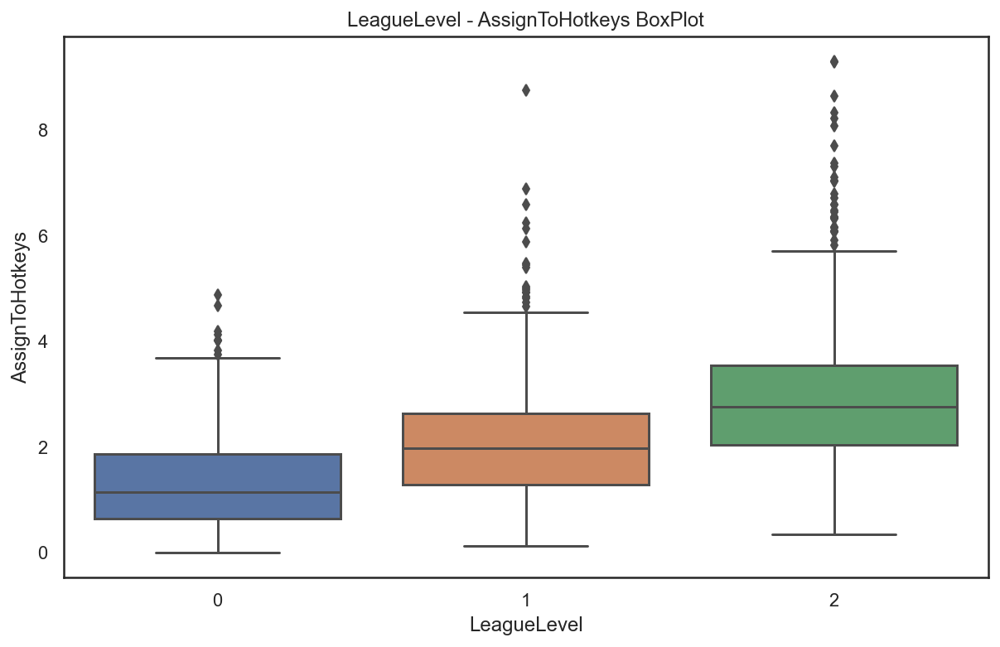

In [84]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - AssignToHotkeys BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'AssignToHotkeys', data = train_df)

In [85]:
# 수준 1에서 극단값 1개 제거
train_df[train_df['LeagueLevel'] == 1].sort_values(by='AssignToHotkeys',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2870,4,8.0,500.0,91.9680,8.752468,0.191691,0.319662,0.383382,26.3915,58.7518,4.4858,1.277735,3.769304,0.511353,0.0,0.766658,83116,1
1334,4,14.0,1000.0,163.8750,6.889842,0.688983,0.000000,2.066955,19.1398,39.0638,9.5638,2.411446,5.684355,0.344619,0.0,0.000000,30828,1
2827,4,20.0,980.0,156.0378,6.587129,0.871828,0.484272,1.065563,35.0270,54.2796,7.2473,2.034261,5.521338,0.581217,0.0,1.646790,54816,1


In [86]:
idx = train_df[train_df['LeagueLevel'] == 1].sort_values(by='AssignToHotkeys',ascending=False).head(1).index

In [87]:
train_df.drop(idx, inplace=True)

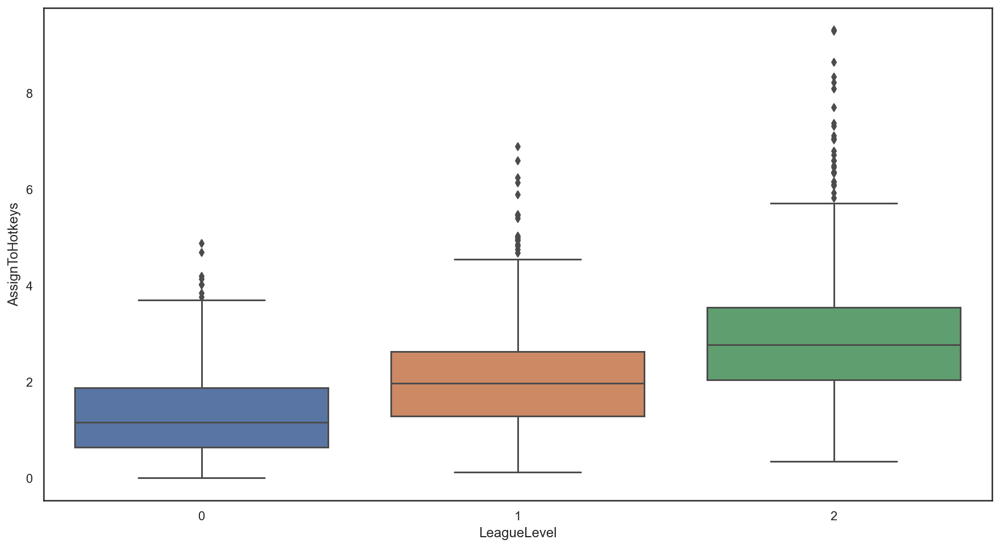

In [88]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'AssignToHotkeys', data = train_df)

## UniqueHotkeys

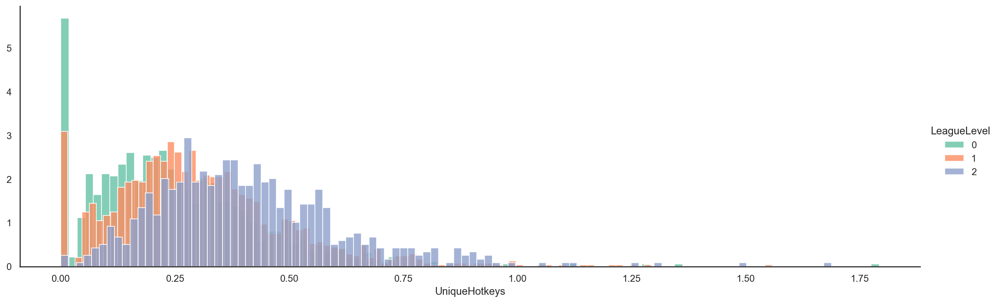

In [89]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'UniqueHotkeys',bins=100,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


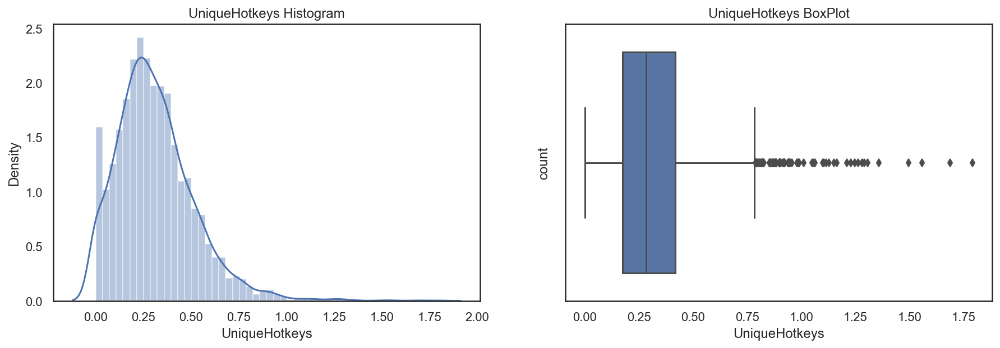

In [90]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    plt.title("UniqueHotkeys Histogram")
    sns.distplot(train_df['UniqueHotkeys'])
    
    plt.subplot(2,2,2)
    plt.title("UniqueHotkeys BoxPlot")
    sns.boxplot(train_df['UniqueHotkeys'])
    plt.ylabel('count')

In [91]:
train_df['UniqueHotkeys'].describe()

count    3360.000000
mean        0.311830
std         0.203753
min         0.000000
25%         0.173637
50%         0.283820
75%         0.417897
max         1.792465
Name: UniqueHotkeys, dtype: float64

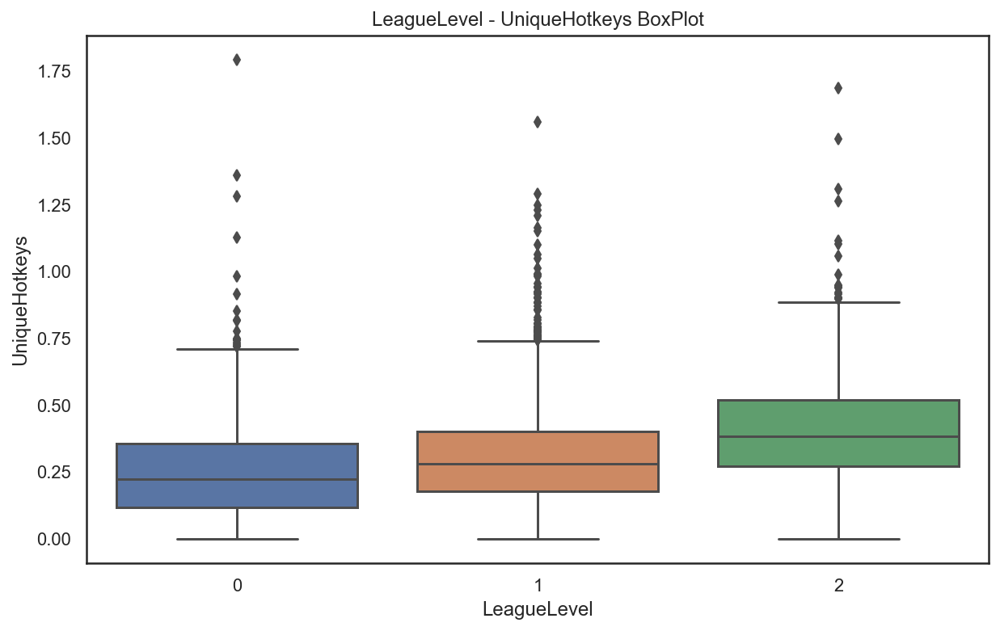

In [92]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - UniqueHotkeys BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'UniqueHotkeys', data = train_df)

In [93]:
# 수준 0에서 1분당 1회 이상 UniqueHotkeys사용은 극단값으로 가정하였음
train_df[train_df['LeagueLevel'] == 0].sort_values(by='UniqueHotkeys',ascending=False).head(5)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
1244,3,42.0,30.0,95.6886,2.867947,1.792465,0.000000,1.613220,33.1064,110.3333,8.0833,1.254726,4.122684,0.716988,0.0,0.000000,29624,0
2135,3,12.0,1256.0,192.3036,3.262337,1.359307,0.000000,0.679653,27.7447,39.0704,7.6197,2.174891,4.213857,0.407808,0.0,0.000000,39064,0
1369,1,20.0,80.0,41.8968,2.048609,1.280384,0.127971,0.512415,63.0000,145.0435,3.9130,1.408419,5.505408,0.768230,0.0,0.000000,41472,0
1951,3,12.0,900.0,67.4568,3.835073,1.127961,0.000000,5.075834,38.0870,65.6403,3.2734,1.240761,5.188613,0.563980,0.0,0.225675,47076,0
857,3,8.0,200.0,65.9718,1.542300,0.981463,0.000000,0.560837,55.4754,65.9187,3.5447,1.682511,6.589710,0.560837,0.0,0.000000,37872,0


In [94]:
idx = train_df[train_df['LeagueLevel'] == 0].sort_values(by='UniqueHotkeys',ascending=False).head(4).index

In [95]:
train_df.drop(idx, inplace=True)

In [96]:
# 수준 1에서 상위 1개의 UniqueHotkeys사용은 극단값으로 가정하였음
train_df[train_df['LeagueLevel'] == 1].sort_values(by='UniqueHotkeys',ascending=False).head(1)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2370,5,20.0,1080.0,113.139,3.116657,1.558326,0.0,9.739544,33.5814,70.9425,5.7931,2.921865,5.259343,0.973955,0.0,0.0,27260,1


In [97]:
idx = train_df[train_df['LeagueLevel'] == 1].sort_values(by='UniqueHotkeys',ascending=False).head(1).index

In [98]:
train_df.drop(idx, inplace=True)

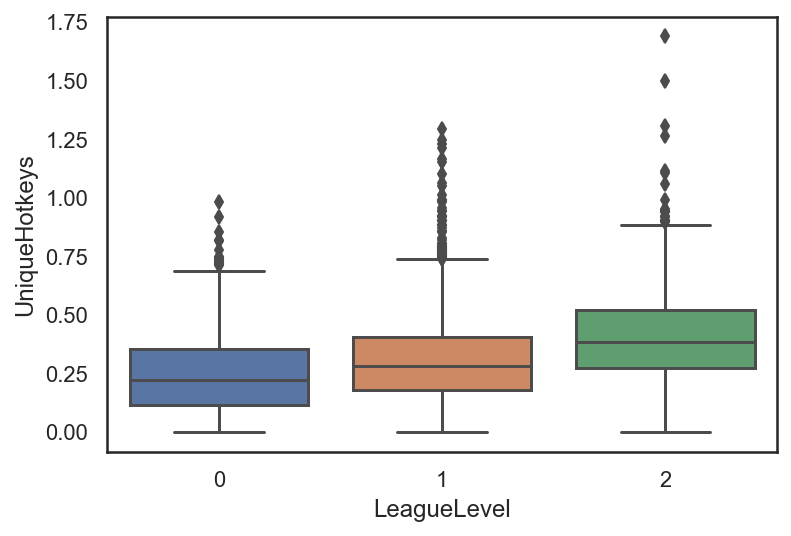

In [99]:
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'UniqueHotkeys', data = train_df)

## MinimapAttacks

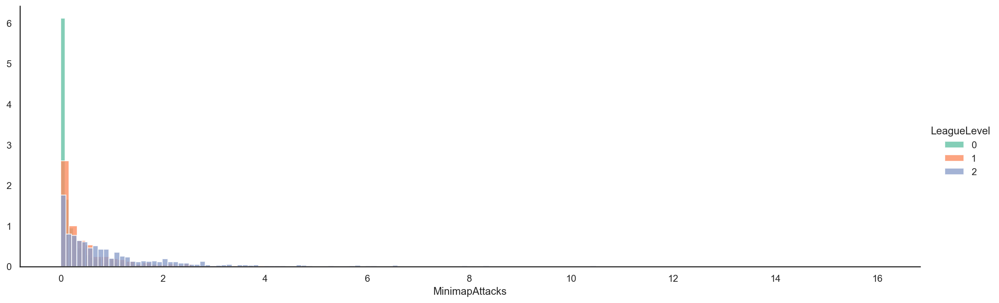

In [100]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'MinimapAttacks',bins=100,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


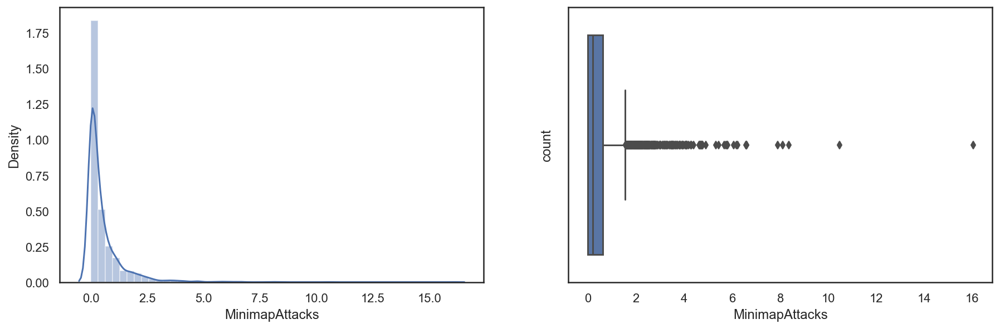

In [101]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['MinimapAttacks'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['MinimapAttacks'])
    plt.ylabel('count')

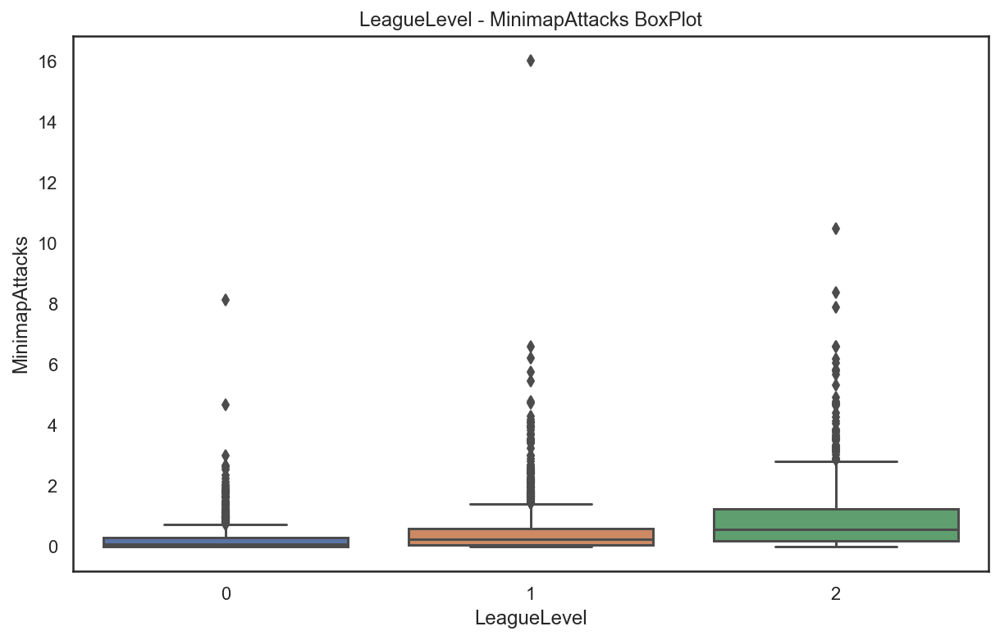

In [102]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - MinimapAttacks BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'MinimapAttacks', data = train_df)

In [103]:
# Minimap Attacks가 0인 이유는?
# Minimap Attacks : Minimap에서 Attack을 하지 않았음

In [104]:
# 수준 0에서 상위 2개의값, 수준1에서 상위 1개의 값은 이상값이라고 판단하였음
# Minimap 변수에 대한 목적 : 얼마만큼 더 나은 플레이어가 이 맵에 주의를 기울이고 사용하는 데 더 나은 일을 할 것이지만 위의 극단값은 오히려 경기에 집중하지 않은 것으로 보임

In [105]:
# 수준 0에서 상위 2개의 UniqueHotkeys사용은 극단값으로 가정하였음
train_df[train_df['LeagueLevel'] == 0].sort_values(by='MinimapAttacks',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
877,3,6.0,450.0,146.9388,0.580330,0.435420,8.124592,7.689342,44.4848,74.44,8.0300,2.176229,4.352448,0.435420,0.0,0.000000,36600,0
3248,2,16.0,80.0,92.1876,1.469909,0.086553,4.669120,2.507488,39.4126,81.75,6.9236,1.124047,5.014976,0.432234,0.0,0.173106,61412,0


In [106]:
# 수준1에서 상위 1개의 UniqueHotkeys사용은 극단값으로 가정하였음
train_df[train_df['LeagueLevel'] == 1].sort_values(by='MinimapAttacks',ascending=False).head(1)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
197,5,24.0,600.0,125.8662,2.814523,0.301608,16.032733,3.819711,31.8929,71.3353,6.724,1.407262,6.433065,0.552851,0.502857,1.708811,105652,1


In [107]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='MinimapAttacks',ascending=False).head(2).index

In [108]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='MinimapAttacks',ascending=False).head(1).index

In [109]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

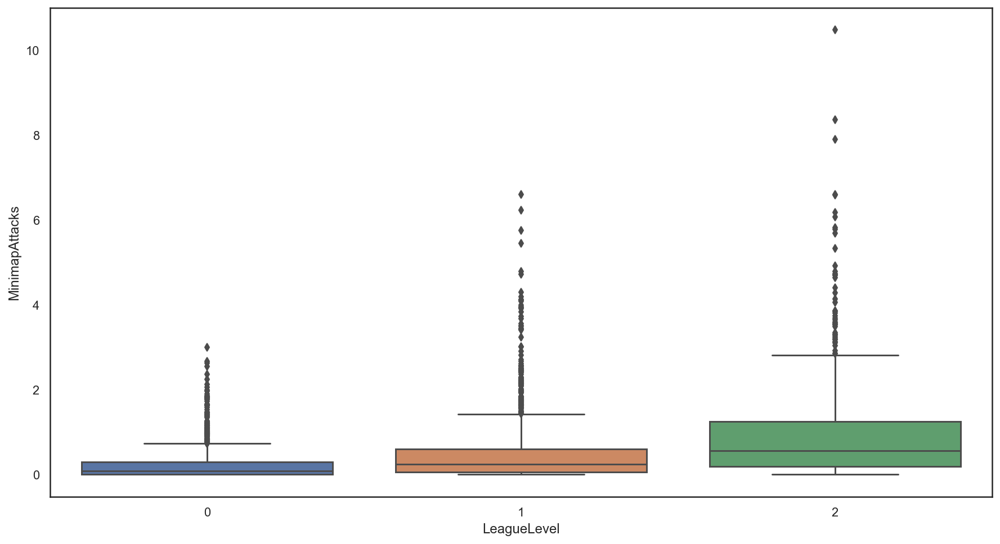

In [110]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'MinimapAttacks', data = train_df)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


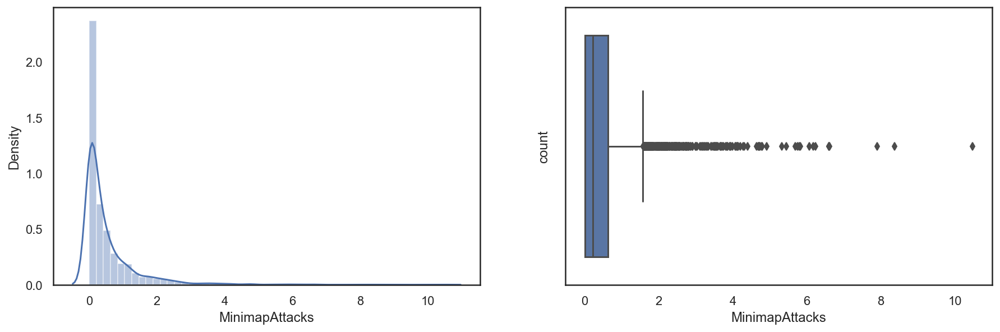

In [111]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['MinimapAttacks'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['MinimapAttacks'])
    plt.ylabel('count')

## MinimapRightClicks

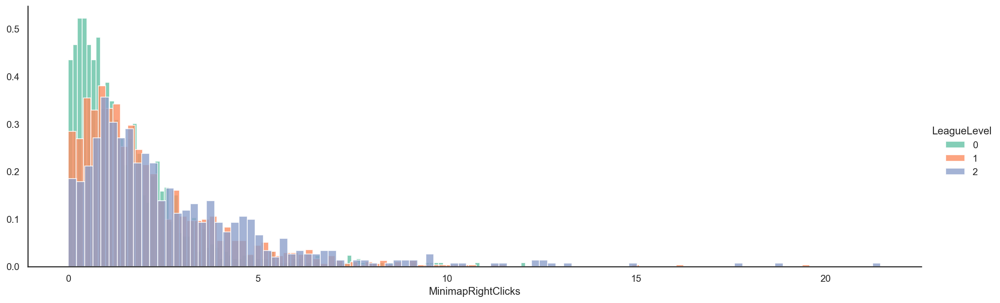

In [112]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'MinimapRightClicks',bins=100,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


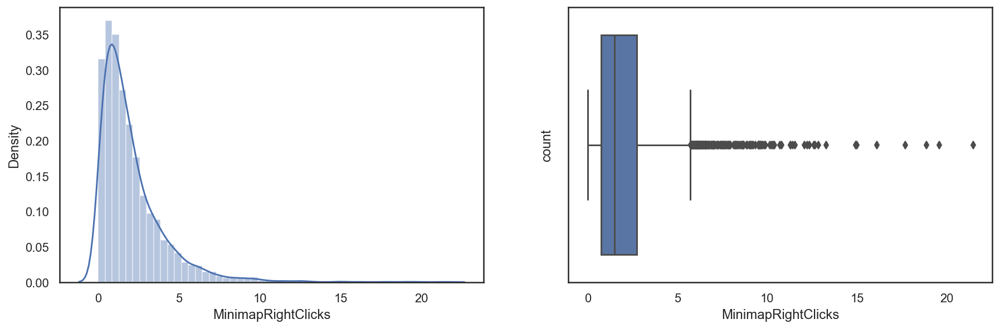

In [113]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['MinimapRightClicks'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['MinimapRightClicks'])
    plt.ylabel('count')

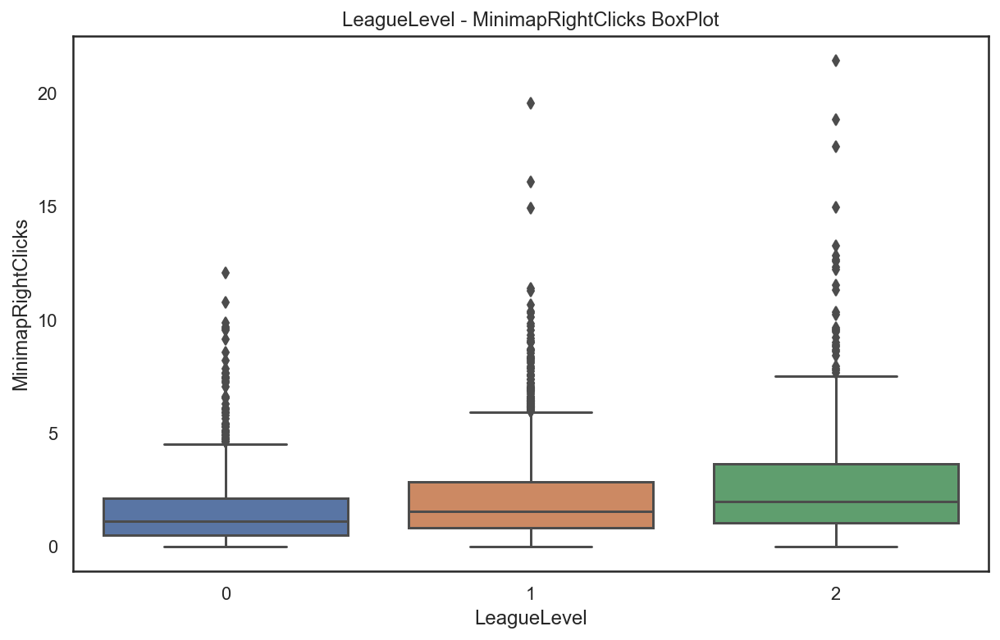

In [114]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - MinimapRightClicks BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'MinimapRightClicks', data = train_df)

In [115]:
# 프로 수준에 해당하는 MinimapRightClicks에 대해서는 이상치라고 판단하였음

In [116]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='MinimapRightClicks',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
1370,4,16.0,1100.0,113.6976,2.774709,0.317007,0.317007,19.581517,43.0549,63.9563,7.4262,2.299044,4.677367,0.396126,0.0,0.079119,66980,1
2807,5,20.0,720.0,135.2730,1.265575,0.406746,0.271341,16.090909,19.7576,55.1907,6.6256,1.355978,5.966316,0.316476,0.0,0.000000,117480,1
1067,4,8.0,450.0,169.0749,0.982462,0.589474,0.785970,14.933393,25.4321,54.2439,9.5854,3.340362,2.161436,0.392940,0.0,0.000000,27024,1


In [117]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='MinimapRightClicks',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
767,3,8.0,540.0,152.7588,1.280485,0.365859,0.182664,12.073172,19.1837,90.8800,12.6800,1.463415,4.573184,0.548778,0.000000,0.000000,29028,0
1468,2,8.0,400.0,119.2446,0.651744,0.163017,1.727115,10.786325,34.9925,67.4637,6.3408,0.749501,3.323901,0.228330,0.326034,0.847264,162948,0


In [118]:
idx1 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='MinimapRightClicks',ascending=False).head(3).index
idx2 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='MinimapRightClicks',ascending=False).head(2).index

In [119]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

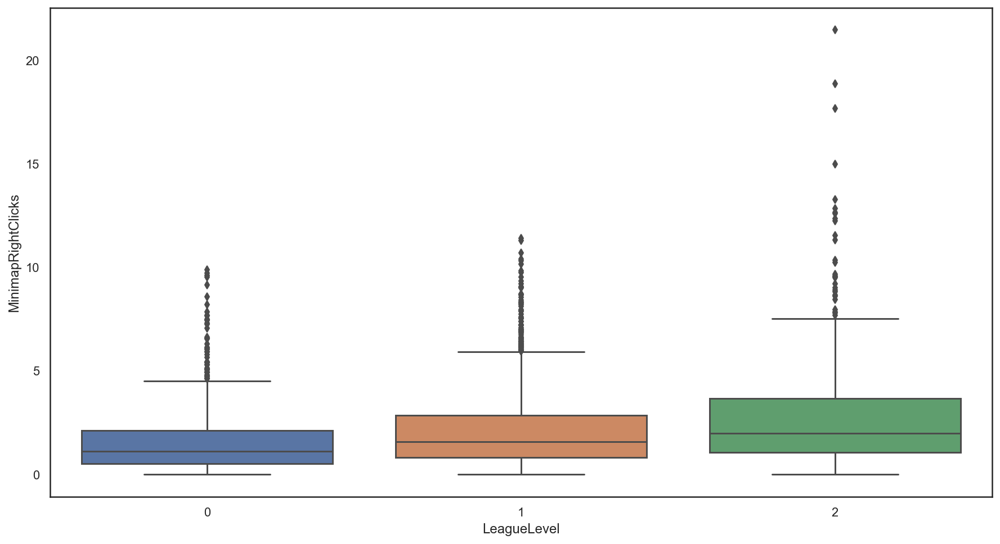

In [120]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'MinimapRightClicks', data = train_df)

## GapBetweenPACs

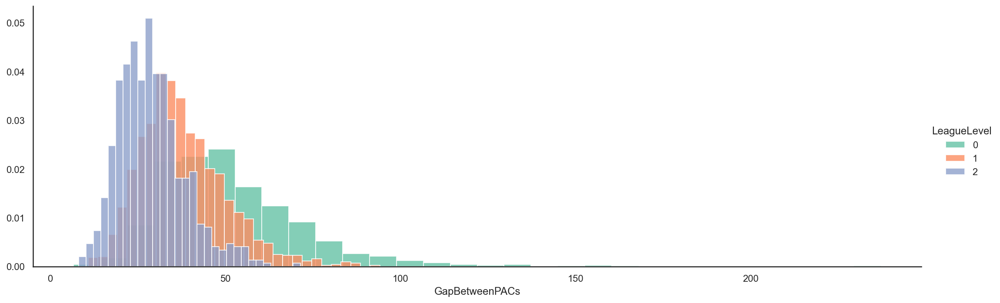

In [121]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'GapBetweenPACs',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


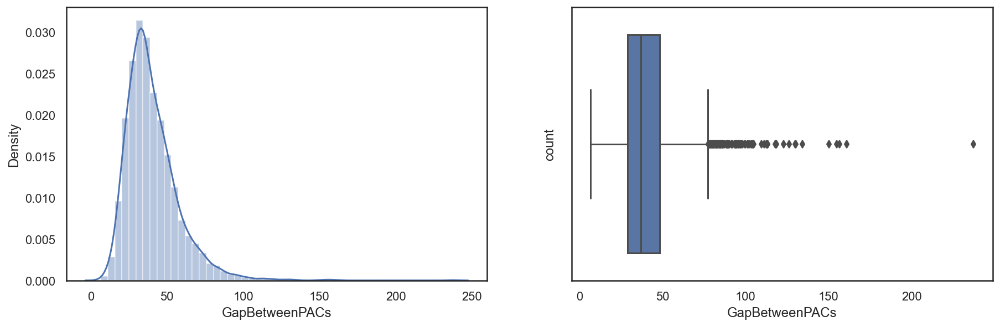

In [122]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['GapBetweenPACs'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['GapBetweenPACs'])
    plt.ylabel('count')

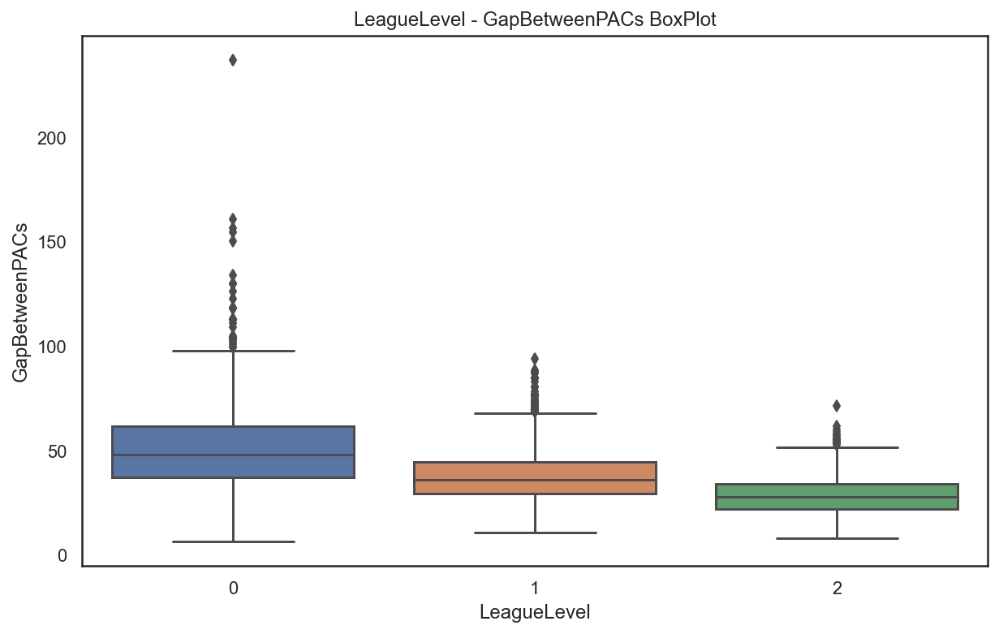

In [123]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - GapBetweenPACs BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'GapBetweenPACs', data = train_df)

In [124]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='GapBetweenPACs',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
1358,1,16.0,80.0,37.31454,0.204435,0.000000,0.0,1.83949,237.1429,161.6364,8.0909,3.678986,0.408870,0.408870,0.0,0.0,25980,0
2950,1,24.0,730.0,28.11180,0.370107,0.231516,0.0,0.00000,160.9535,168.9249,3.1792,0.786379,3.793145,0.138591,0.0,0.0,114792,0
1502,2,10.0,10.0,44.97000,0.711099,0.474183,0.0,0.00000,156.6234,110.6154,3.8462,2.133293,3.436951,0.592580,0.0,0.0,44804,0


In [125]:
idx = train_df[train_df['LeagueLevel'] == 0].sort_values(by='GapBetweenPACs',ascending=False).head(1).index

In [126]:
train_df.drop(idx, inplace=True)

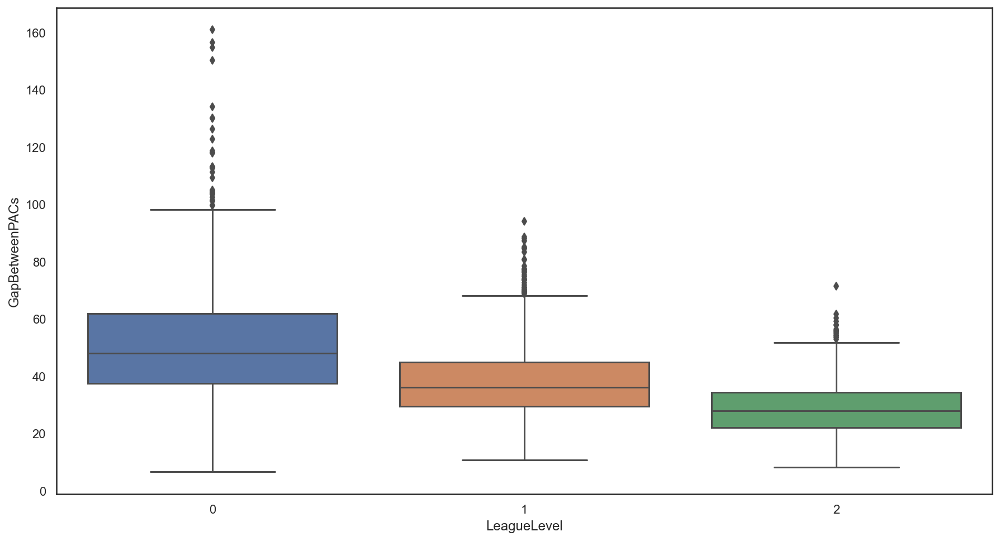

In [127]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'GapBetweenPACs', data = train_df)

## ActionLatency

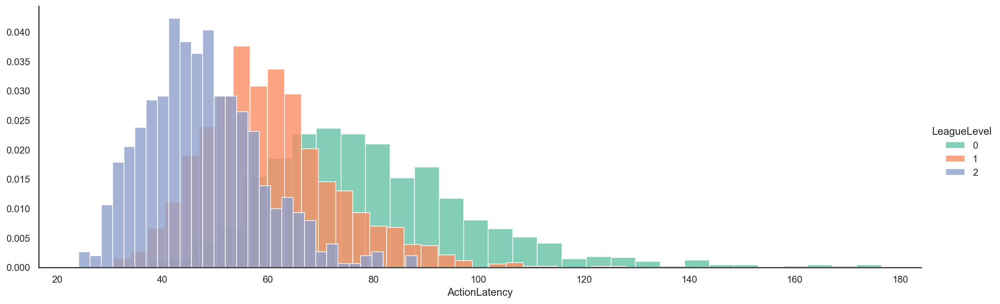

In [128]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'ActionLatency',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


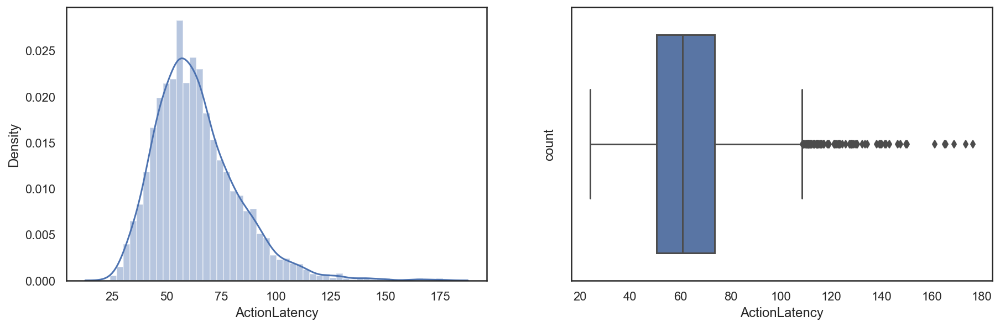

In [129]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['ActionLatency'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['ActionLatency'])
    plt.ylabel('count')

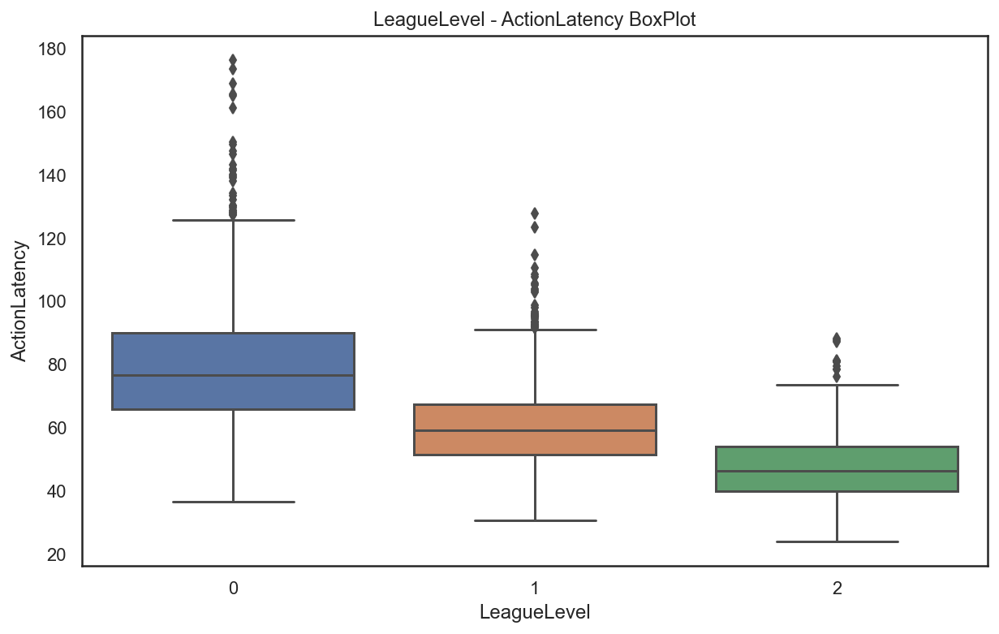

In [130]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - ActionLatency BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'ActionLatency', data = train_df)

## ActionsInPAC

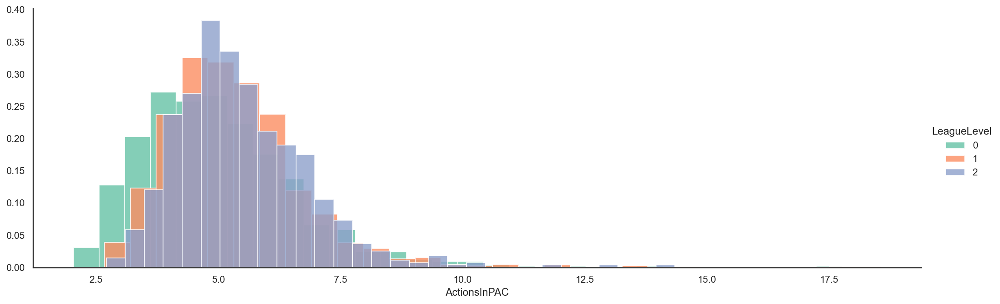

In [131]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'ActionsInPAC',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


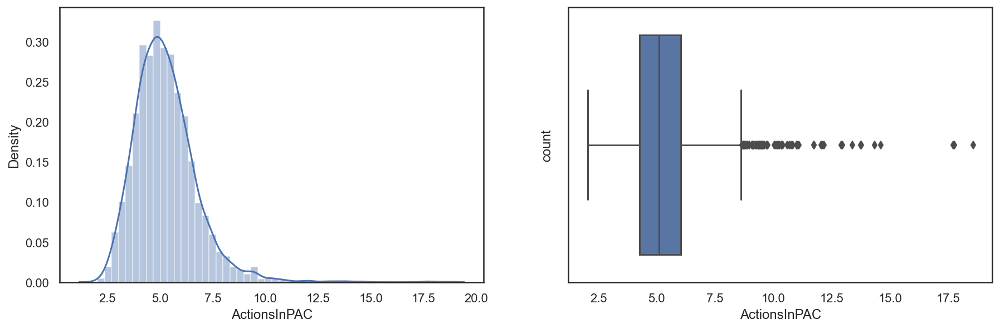

In [132]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['ActionsInPAC'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['ActionsInPAC'])
    plt.ylabel('count')

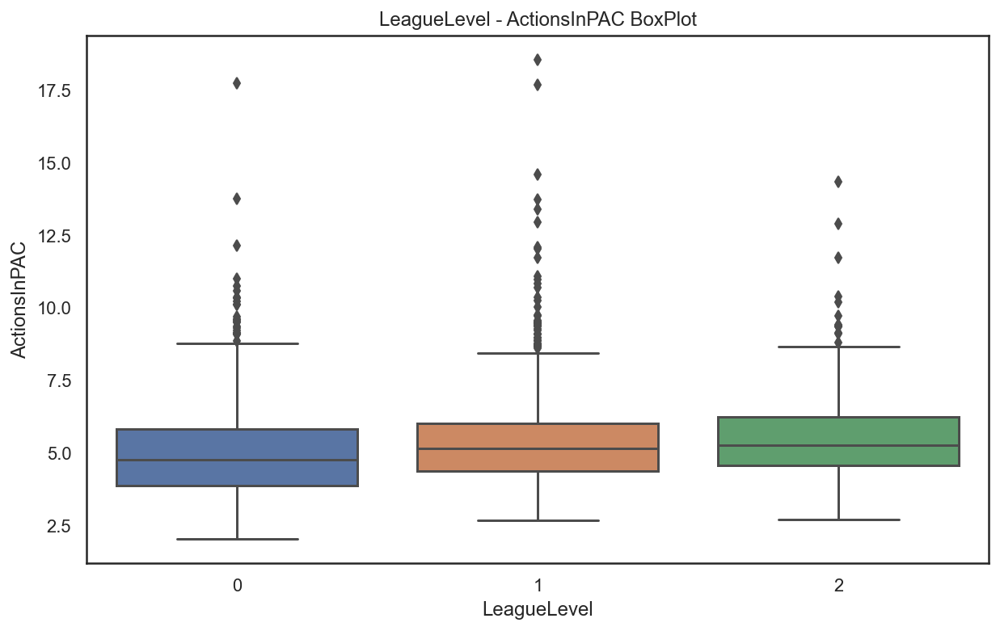

In [133]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - ActionsInPAC BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'ActionsInPAC', data = train_df)

In [134]:
# 프로 보다 PAC의 횟수가 높다는 것이 의미하는 것은?
# 따라서 상위 3개에 대해서 데이터 제거

In [135]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='ActionsInPAC',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
308,2,30.0,700.0,82.9572,1.030135,0.171513,0.0,1.201823,45.8000,93.7143,17.7619,1.030135,3.777162,0.686758,0.0,0.0,30928,0
2423,2,28.0,730.0,76.5840,1.551970,0.423207,0.0,0.564352,63.3939,110.3529,13.7647,1.269796,9.170901,0.564352,0.0,0.0,37636,0
2348,3,16.0,1300.0,130.7862,2.172077,0.603354,0.0,9.532995,64.5867,114.4737,12.1579,1.206708,3.016770,0.724024,0.0,0.0,44004,0


In [136]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='ActionsInPAC',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2555,5,20.0,800.0,162.5916,4.243571,1.291519,3.505561,1.845034,35.4286,89.9535,18.5581,1.660527,4.797107,0.738010,0.0,0.0,28780,1
2536,5,42.0,2500.0,216.1602,1.888337,0.000000,0.157176,2.045699,26.9600,54.2745,17.7059,1.573613,2.832513,0.472059,0.0,0.0,33744,1
3180,4,28.0,450.0,171.4560,0.622656,0.622656,0.000000,1.867962,28.5818,50.7143,14.6071,2.283066,5.811264,1.037760,0.0,0.0,25584,1


In [137]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='ActionsInPAC',ascending=False).head(3).index

In [138]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='ActionsInPAC',ascending=False).head(3).index

In [139]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

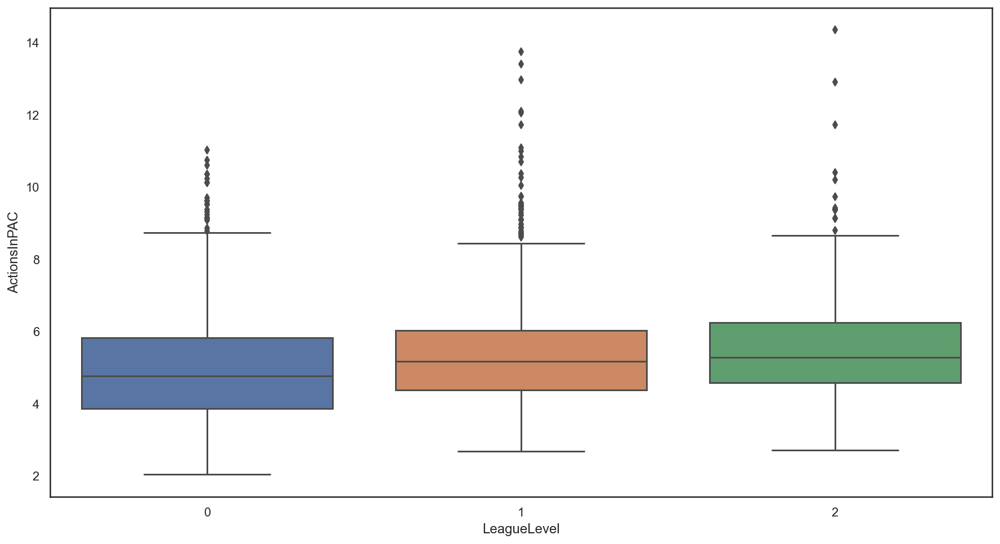

In [140]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'ActionsInPAC', data = train_df)

## TotalMapExplored

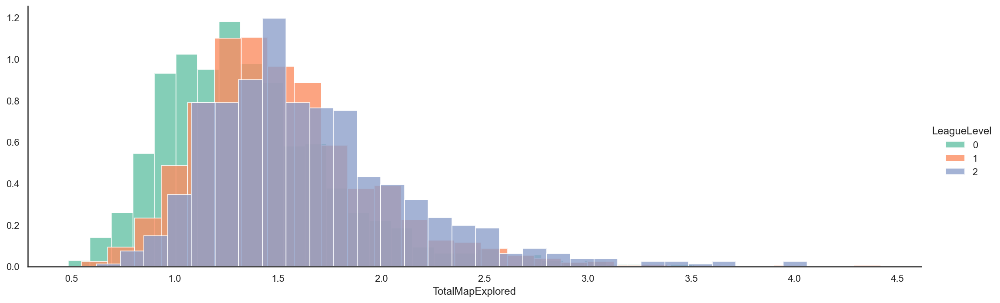

In [141]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'TotalMapExplored',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


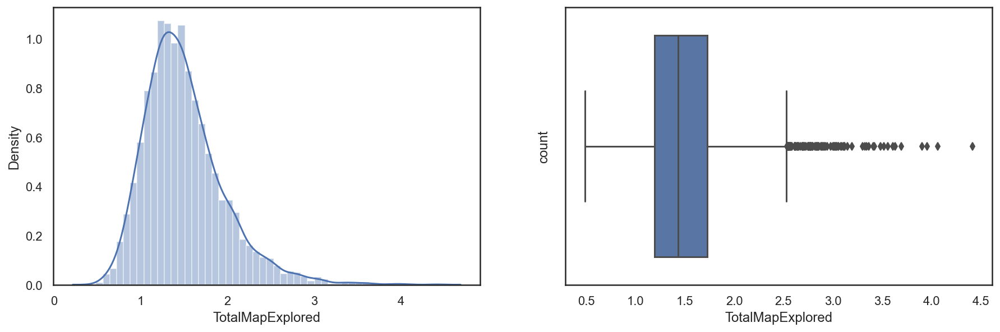

In [142]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['TotalMapExplored'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['TotalMapExplored'])
    plt.ylabel('count')

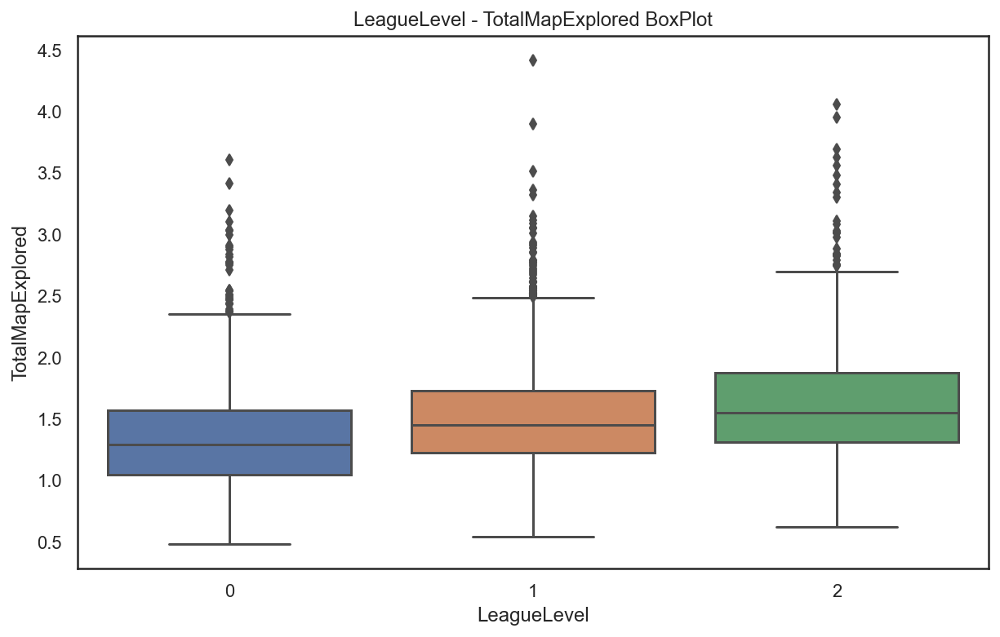

In [143]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - TotalMapExplored BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'TotalMapExplored', data = train_df)

In [144]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='TotalMapExplored',ascending=False).head(3)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2452,2,24.0,2000.0,69.3036,1.082937,0.721958,0.0,0.721958,49.6970,79.5600,3.6300,3.609791,5.775687,0.721958,0.0,0.0,29420,0
2260,2,6.0,300.0,96.2022,1.709411,0.427455,0.0,0.000000,61.2000,77.4321,6.6173,3.418822,5.698161,0.712257,0.0,0.0,37276,0
477,2,10.0,100.0,39.3804,0.504450,0.168327,0.0,1.849356,101.0714,95.6491,4.0526,3.194337,6.725115,0.504450,0.0,0.0,31584,0


In [145]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='TotalMapExplored',ascending=False).head(5)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
930,5,10.0,300.0,111.1386,1.472548,0.736274,0.000000,3.497299,64.1379,67.1818,5.4659,4.417639,4.233557,0.552203,0.0,0.0,28848,1
68,5,8.0,700.0,68.6388,0.468342,0.312228,0.156114,1.405090,84.6087,75.0968,4.6559,3.903036,3.278553,0.468342,0.0,0.0,34012,1
1123,4,8.0,100.0,116.3022,1.758996,0.000000,0.135405,1.623686,57.5593,46.4719,3.7079,3.517992,10.147941,0.676536,0.0,0.0,39244,1
3209,5,6.0,750.0,121.6212,2.301306,0.885119,0.000000,6.195825,52.0519,78.0513,4.9231,3.363450,2.655372,0.531069,0.0,0.0,29996,1
899,4,24.0,1145.0,174.6270,1.846574,0.923287,0.184788,3.139171,49.3034,62.3556,5.5778,3.323826,4.431779,0.553971,0.0,0.0,28756,1


In [146]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='TotalMapExplored',ascending=False).head(3).index

In [147]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='TotalMapExplored',ascending=False).head(2).index

In [148]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

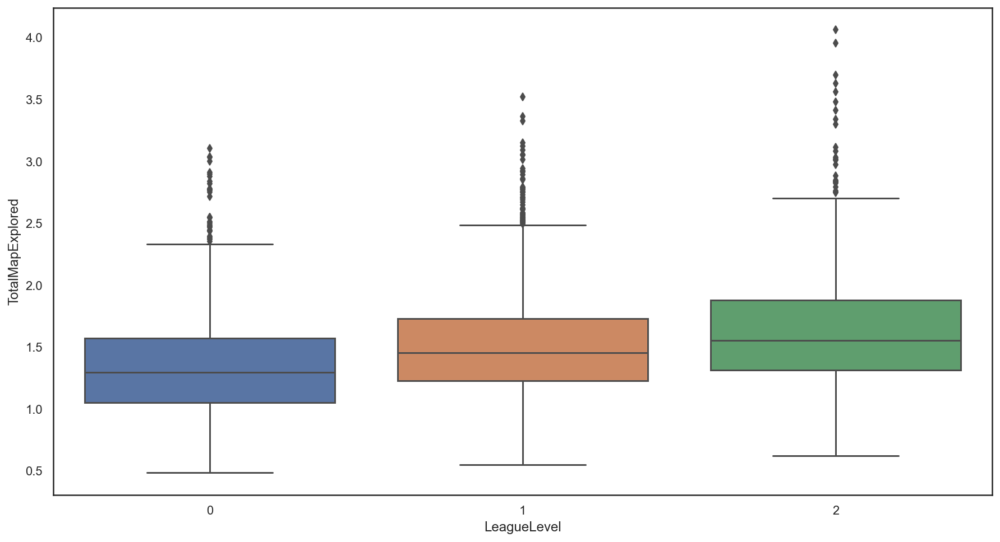

In [149]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'TotalMapExplored', data = train_df)

## WorkersMade

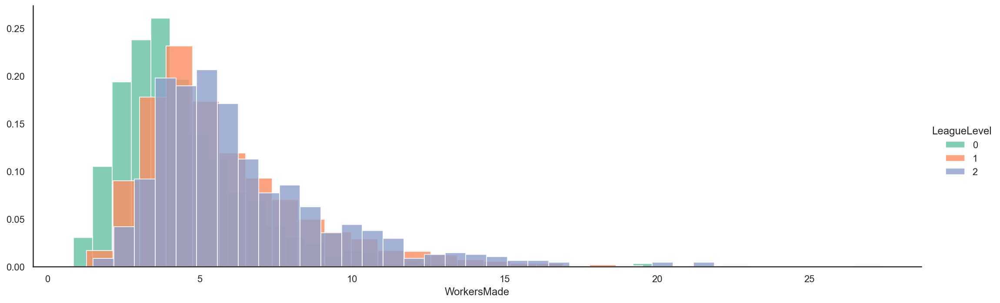

In [150]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'WorkersMade',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


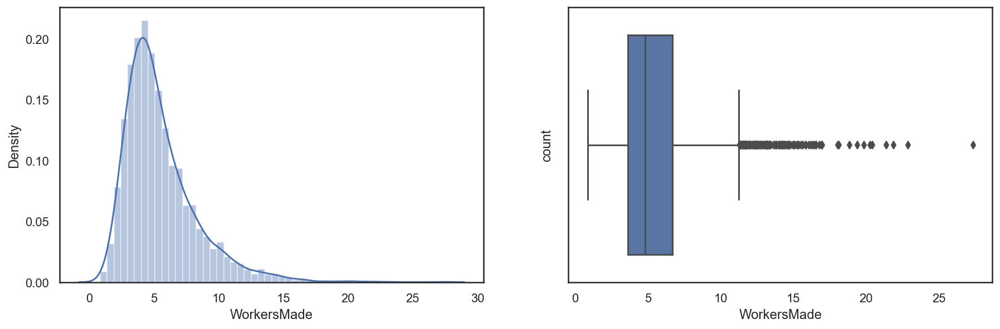

In [151]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['WorkersMade'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['WorkersMade'])
    plt.ylabel('count')

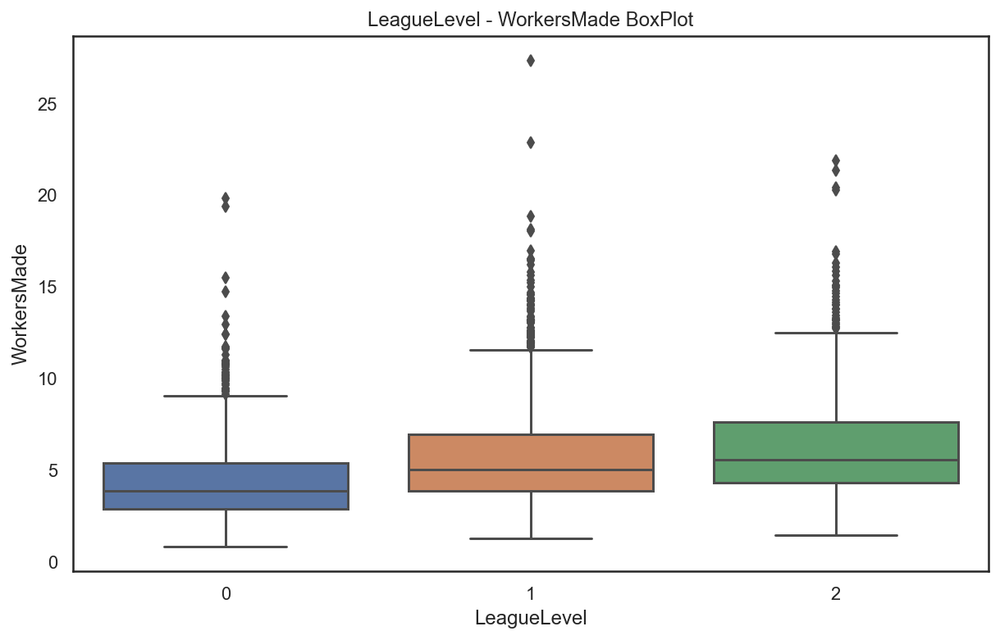

In [152]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - WorkersMade BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'WorkersMade', data = train_df)

In [153]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='WorkersMade',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2681,3,20.0,400.0,132.8898,1.480922,0.493830,0.000000,0.789825,35.933,62.4444,6.3167,1.382193,19.844532,0.592368,0.000000,0.000000,53784,0
3190,3,14.0,200.0,130.5294,1.810508,0.283023,0.113103,2.093404,59.790,60.2408,5.6204,1.244728,19.406457,0.622364,0.905254,3.847361,93852,0


In [154]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='WorkersMade',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2190,5,12.0,500.0,131.7144,2.337011,0.155583,3.505519,0.779004,41.2000,68.6516,6.7602,1.246406,27.342783,0.467280,0.00000,0.000000,68164,1
3033,5,24.0,1500.0,170.0796,2.066928,0.266562,0.266562,4.533901,34.8524,45.4667,5.8222,1.666878,22.869639,0.600078,1.20015,0.466749,79640,1


In [155]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='WorkersMade',ascending=False).head(2).index

In [156]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='WorkersMade',ascending=False).head(2).index

In [157]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

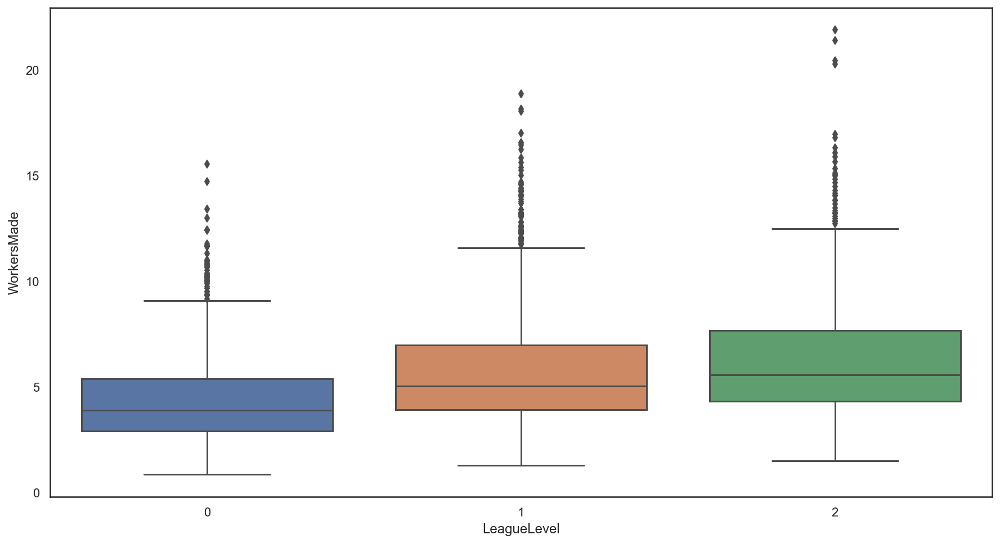

In [158]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'WorkersMade', data = train_df)

## UniqueUnitsMade

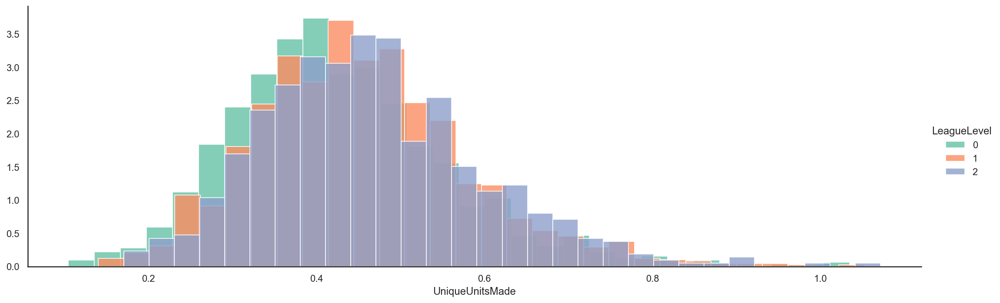

In [159]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'UniqueUnitsMade',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


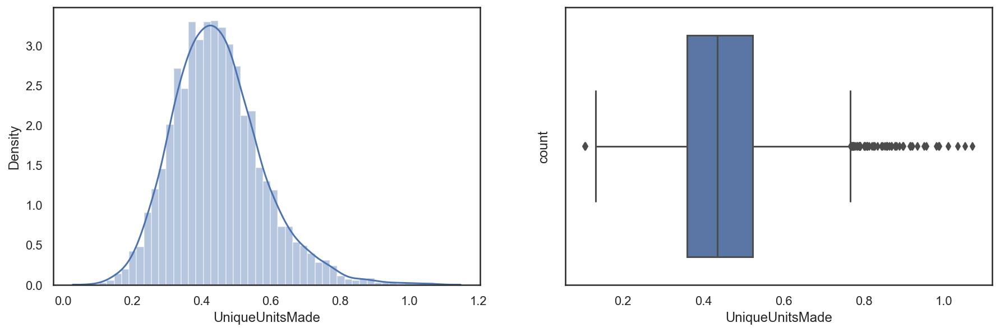

In [160]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['UniqueUnitsMade'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['UniqueUnitsMade'])
    plt.ylabel('count')

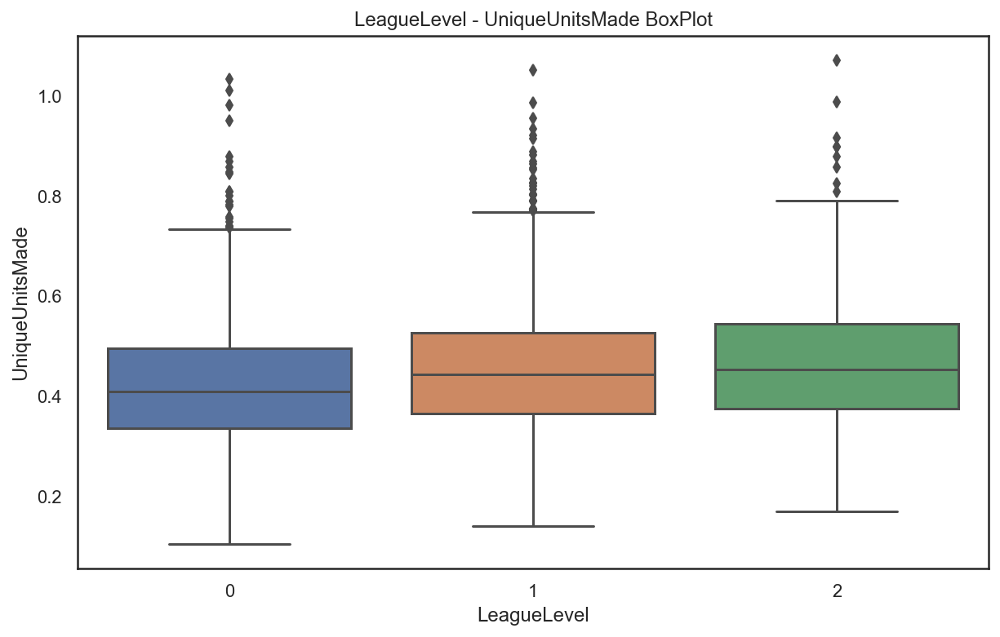

In [161]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - UniqueUnitsMade BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'UniqueUnitsMade', data = train_df)

## ComplexUnitsMade

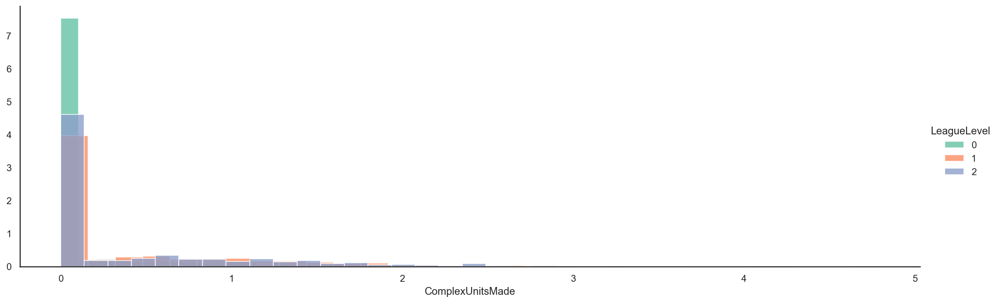

In [162]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'ComplexUnitsMade',bins=30,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


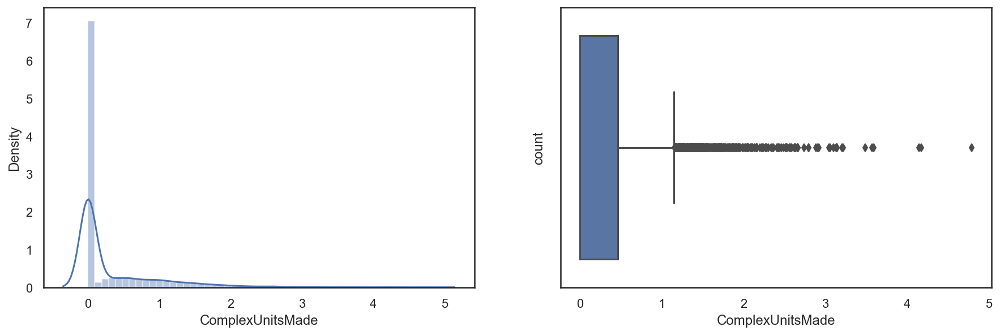

In [163]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['ComplexUnitsMade'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['ComplexUnitsMade'])
    plt.ylabel('count')

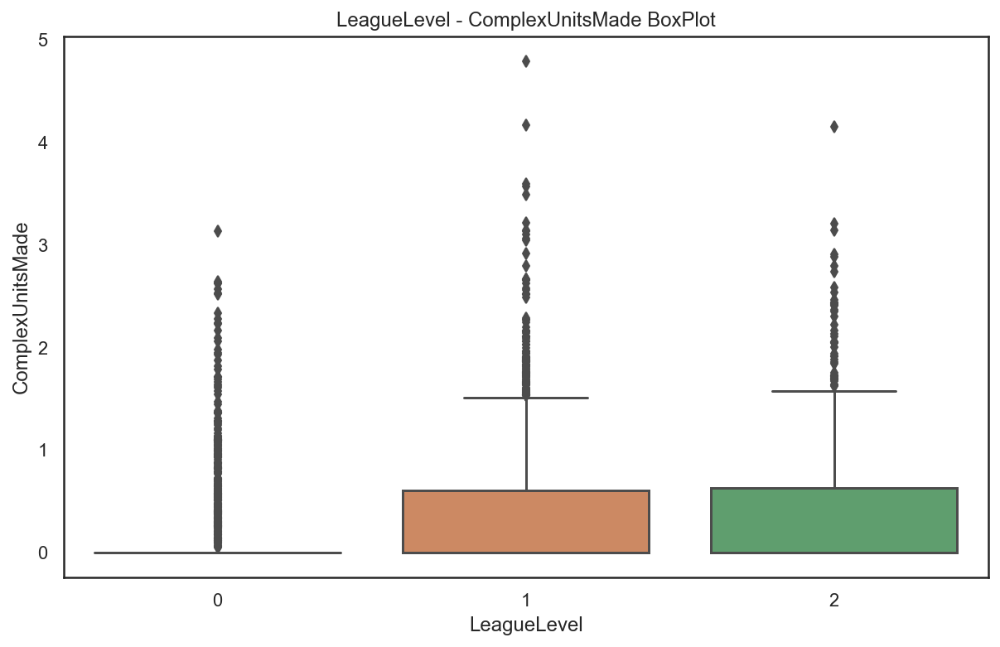

In [164]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - ComplexUnitsMade BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'ComplexUnitsMade', data = train_df)

In [165]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='ComplexUnitsMade',ascending=False).head(1)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
805,3,10.0,500.0,104.1048,2.278887,0.047471,0.0,0.854581,25.1774,72.1053,7.8083,0.902057,3.798137,0.284616,3.133473,5.032553,111844,0


In [166]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='ComplexUnitsMade',ascending=False).head(2)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
918,5,20.0,800.0,155.4156,2.436839,0.165141,0.000000,3.841121,36.6874,46.5124,7.6488,1.321675,7.186554,0.288864,4.791075,3.882406,128564,1
3009,4,24.0,1200.0,144.0828,1.436095,0.341964,1.094168,1.162555,38.1706,53.7143,6.1599,1.504482,16.549146,0.410463,4.171520,6.359787,77648,1


In [167]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='ComplexUnitsMade',ascending=False).head(1).index

In [168]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='ComplexUnitsMade',ascending=False).head(2).index

In [169]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

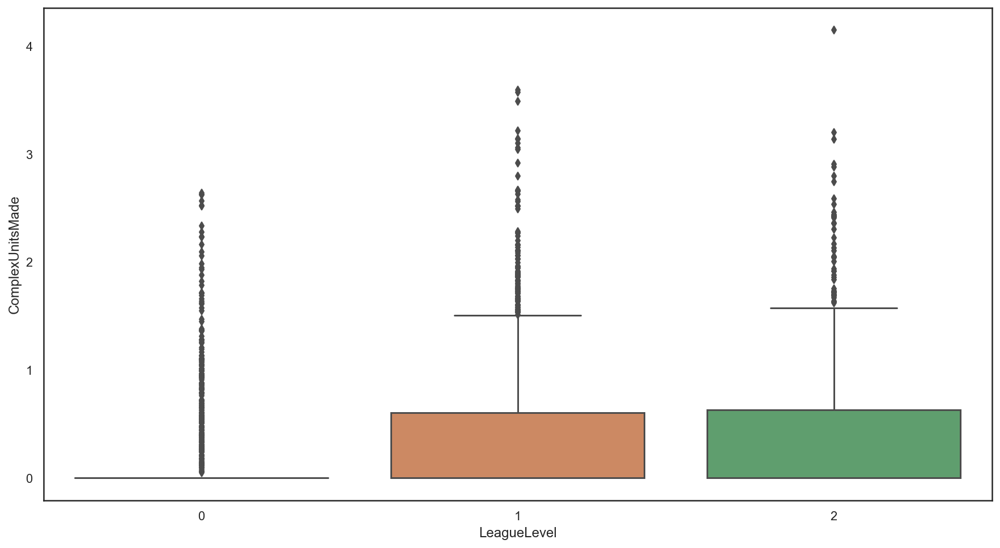

In [170]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'ComplexUnitsMade', data = train_df)

## ComplexAbilityUsed

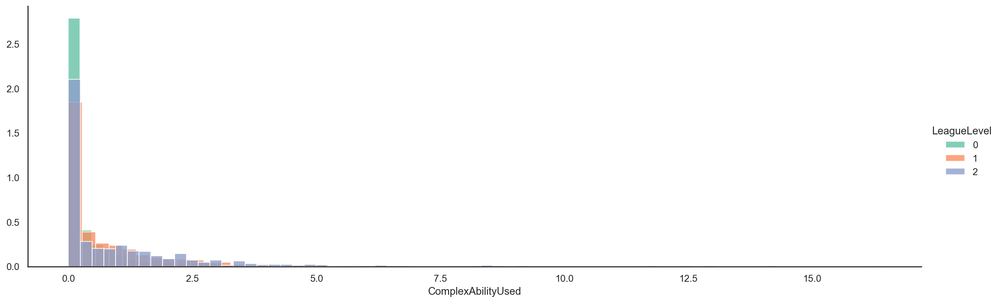

In [171]:
with sns.axes_style('white'):
    facet = sns.FacetGrid(train_df, hue='LeagueLevel',height=5,aspect=3,palette='Set2')
    facet.map(plt.hist,'ComplexAbilityUsed',bins=60,alpha=0.8, density = True)
    facet.add_legend()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


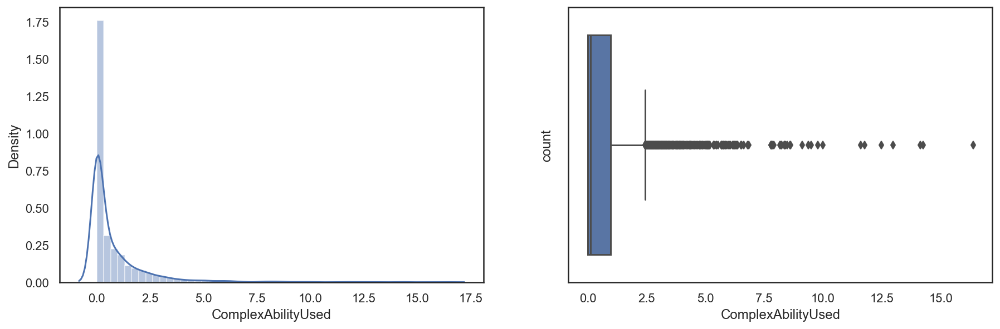

In [172]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['ComplexAbilityUsed'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['ComplexAbilityUsed'])
    plt.ylabel('count')

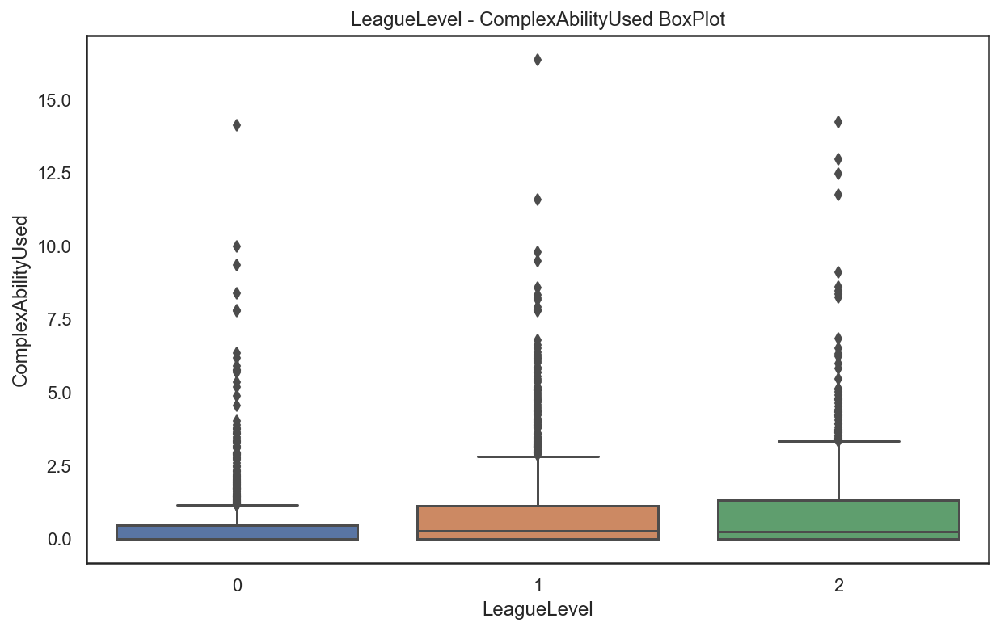

In [173]:
plt.figure(figsize = (10, 6))
with sns.axes_style('white'):
    plt.title("LeagueLevel - ComplexAbilityUsed BoxPlot")
    sns.boxplot(x = 'LeagueLevel', y = 'ComplexAbilityUsed', data = train_df)

In [174]:
train_df[train_df['LeagueLevel'] == 0].sort_values(by='ComplexAbilityUsed',ascending=False).head(10)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
3144,3,30.0,1400.0,155.9970,1.094041,0.312759,0.000000,3.047680,31.4647,36.5848,7.6895,1.094041,3.555629,0.390816,1.054964,14.144247,135900,0
3131,3,8.0,450.0,69.1434,1.558660,0.000000,0.562849,1.558660,66.5483,98.6923,6.3154,1.601953,6.018354,0.346212,0.649440,10.001385,122644,0
3005,2,12.0,196.0,91.3842,0.734389,0.458784,0.091863,1.744176,72.2642,72.7850,8.5514,1.652376,6.793083,0.550790,1.009787,9.363654,57844,0
3102,3,18.0,250.0,115.1166,2.000925,0.164079,0.295236,9.611010,68.0967,69.1053,7.5461,1.312085,4.985931,0.262314,2.525760,8.397234,161880,0
494,2,8.0,26.0,94.5504,0.585576,0.106731,0.159831,3.619923,40.5191,71.9087,6.7871,1.330856,5.323275,0.319662,1.011449,7.825347,99748,0
2758,3,24.0,80.0,100.2066,1.227067,0.245322,0.000000,2.515485,36.9825,58.8531,5.6224,1.595182,9.939258,0.490644,2.638189,7.791894,86548,0
522,3,10.0,300.0,123.8316,0.786432,0.302670,0.121068,3.508705,42.9787,57.9030,5.5394,1.451876,6.775560,0.483741,2.238314,6.351822,87776,0
345,2,8.0,100.0,84.2382,0.760073,0.146025,0.204435,2.952599,76.2420,70.7584,4.4614,0.847773,2.484868,0.204435,2.280226,6.197301,181640,0
2818,3,20.0,60.0,94.7502,1.661324,0.259659,0.155583,4.724387,43.4138,56.1948,5.1232,1.453655,3.426490,0.363204,1.090244,5.918526,102280,0
2634,2,14.0,250.0,110.7420,0.250632,0.107262,0.035842,0.465687,26.2203,46.8133,4.3300,1.217790,3.617544,0.322317,0.967068,5.766660,148252,0


In [175]:
train_df[train_df['LeagueLevel'] == 1].sort_values(by='ComplexAbilityUsed',ascending=False).head(10)

,LeagueIndex,HoursPerWeek,TotalHours,APM,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilityUsed,MaxTimeStamp,LeagueLevel
2546,5,6.0,250.0,138.1668,3.869439,0.377541,0.566258,1.179707,36.9593,51.7652,6.2957,1.510026,8.682381,0.377541,2.029094,16.374447,112528,1
2013,4,20.0,400.0,96.6942,1.508667,0.209745,0.000000,0.754333,59.4397,71.9914,5.3720,1.592480,5.070784,0.335061,3.059240,11.608191,126708,1
2954,4,24.0,500.0,101.3490,1.094014,0.230454,0.000000,0.518256,30.5289,69.3498,7.7407,1.036432,5.642937,0.403029,1.900130,9.788454,92220,1
482,5,12.0,730.0,104.3202,2.125800,0.250101,0.917010,6.544129,44.0656,60.6075,5.9369,1.000377,10.170243,0.250101,2.667670,9.503838,127392,1
2778,4,20.0,300.0,104.7984,0.805718,0.160893,0.000000,1.826295,41.6401,53.7529,5.6353,1.074287,7.251336,0.322317,3.491442,8.594235,98856,1
566,5,10.0,730.0,138.0774,2.418466,0.331875,0.189567,0.948419,36.9484,52.8150,5.9251,1.090679,5.785245,0.379134,1.327787,8.346258,111976,1
1368,5,16.0,1000.0,292.5408,2.081807,0.267093,0.053631,1.761529,14.4179,30.7593,9.4690,1.441251,5.658336,0.480555,1.334493,8.220411,99476,1
467,5,4.0,350.0,168.9216,3.153466,0.256473,0.403560,2.383436,23.9539,46.3816,6.3849,1.136717,8.983458,0.256473,3.593484,8.176869,144812,1
531,4,12.0,500.0,111.9798,1.846314,0.527283,0.461439,0.857220,49.9678,59.3077,4.8974,1.582555,14.243013,0.329751,3.099171,7.912962,80528,1
2316,4,2.0,300.0,145.4652,3.746656,0.492768,0.000000,0.345150,40.7228,56.6222,5.7654,1.971927,6.359256,0.394533,1.577543,7.838622,107712,1


In [176]:
idx1 = train_df[train_df['LeagueLevel'] == 0].sort_values(by='ComplexAbilityUsed',ascending=False).head(6).index

In [177]:
idx2 = train_df[train_df['LeagueLevel'] == 1].sort_values(by='ComplexAbilityUsed',ascending=False).head(4).index

In [178]:
train_df.drop(idx1, inplace=True)
train_df.drop(idx2, inplace=True)

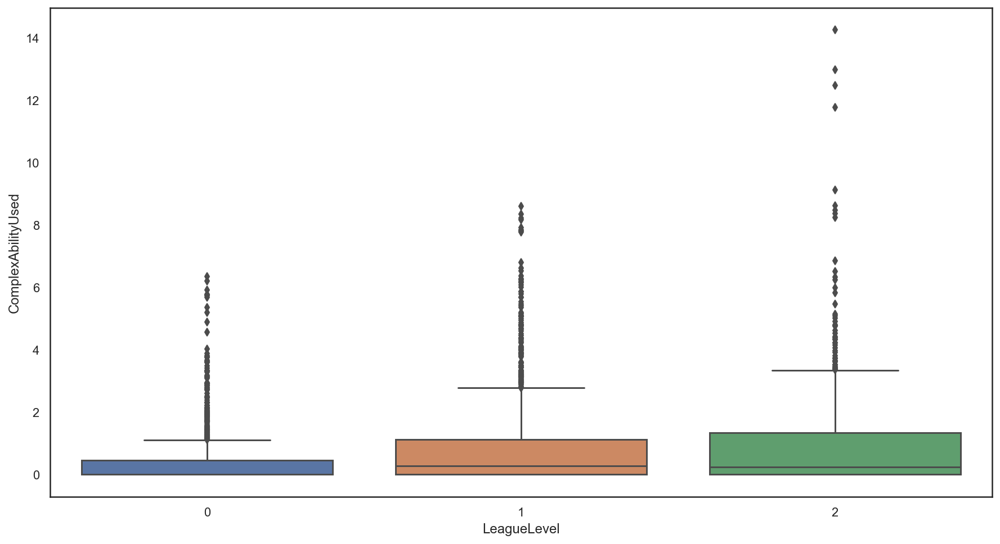

In [179]:
plt.figure(figsize = (15, 8))
with sns.axes_style('white'):
    sns.boxplot(x = 'LeagueLevel', y = 'ComplexAbilityUsed', data = train_df)

## MaxTimeStamp

In [180]:
# MaxTimeStamp : Time stamp of game's last recorded event
# 직역 : 플레이어가 가장 최근에 기록한 타임스탬프
# 의미하는 것에 대해 알아보기 위해 산점도를 다시 그려보자
# 예상 : 플레이 타임을 의미하는 것으로 보임

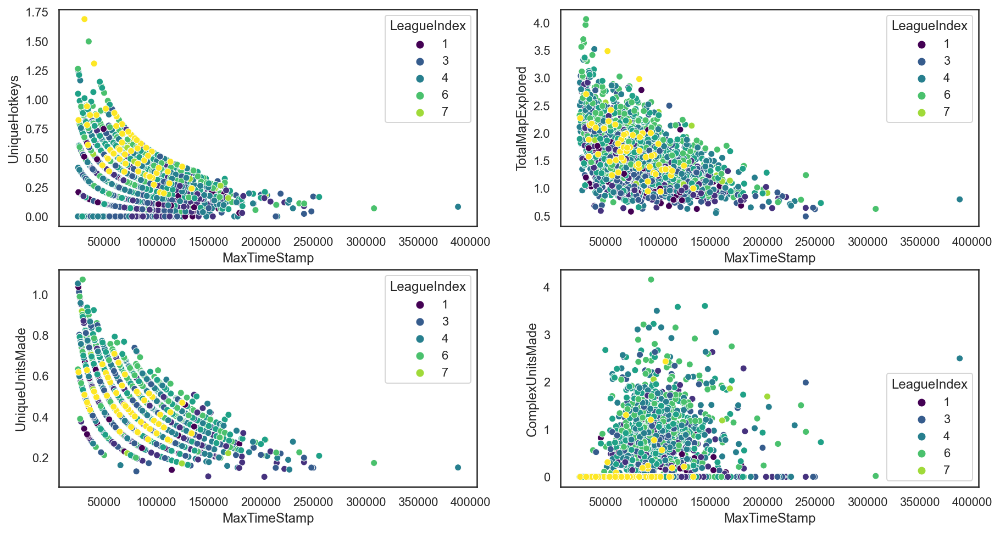

In [181]:
plt.figure(figsize = (15, 8))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.scatterplot(x= 'MaxTimeStamp', y = 'UniqueHotkeys', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,2)    
    sns.scatterplot(x= 'MaxTimeStamp', y = 'TotalMapExplored', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,3)    
    sns.scatterplot(x= 'MaxTimeStamp', y = 'UniqueUnitsMade', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,4)    
    sns.scatterplot(x= 'MaxTimeStamp', y = 'ComplexUnitsMade', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)

In [182]:
# 타임스탬프의 단위를 분으로 바꾸면?
train_df['PlayTime'] = train_df.MaxTimeStamp/(88.5*60)

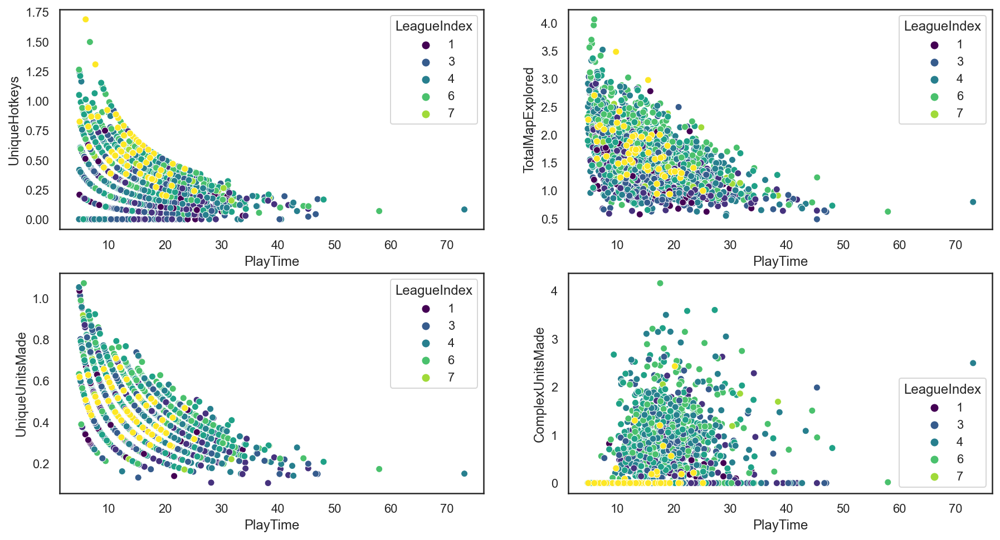

In [183]:
plt.figure(figsize = (15, 8))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.scatterplot(x= 'PlayTime', y = 'UniqueHotkeys', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,2)    
    sns.scatterplot(x= 'PlayTime', y = 'TotalMapExplored', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,3)    
    sns.scatterplot(x= 'PlayTime', y = 'UniqueUnitsMade', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)
    
    plt.subplot(2,2,4)    
    sns.scatterplot(x= 'PlayTime', y = 'ComplexUnitsMade', hue = 'LeagueIndex', palette='viridis',
                    data = train_df)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


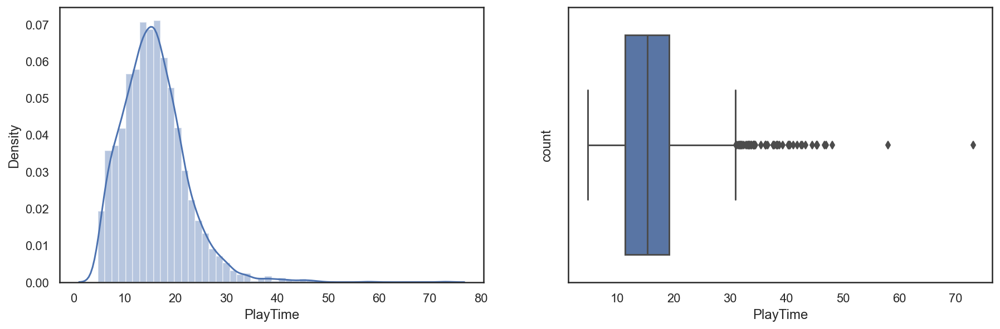

In [184]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['PlayTime'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['PlayTime'])
    plt.ylabel('count')

In [185]:
# 상위 2개의 값을 이상치로 판단
idx = train_df.sort_values(by='PlayTime',ascending=False).head(2).index

In [186]:
train_df.drop(idx, inplace=True)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


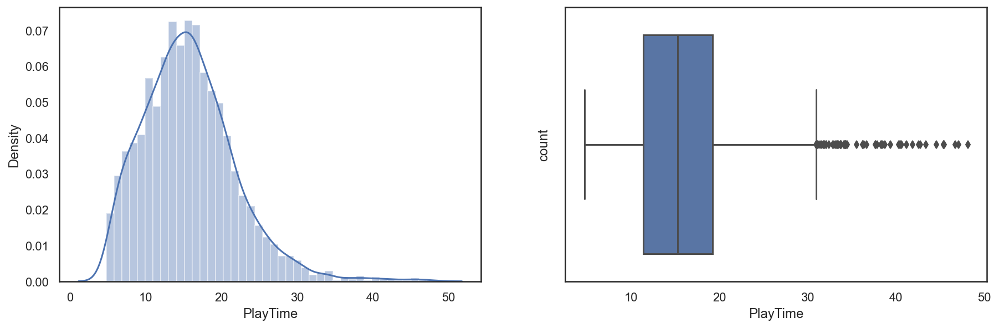

In [187]:
plt.figure(figsize = (15, 10))

with sns.axes_style('white'):
    plt.subplot(2,2,1)
    sns.distplot(train_df['PlayTime'])
    
    plt.subplot(2,2,2)    
    sns.boxplot(train_df['PlayTime'])
    plt.ylabel('count')

## Group By LeagueLevel Variable Mean(Outlier Delete)

In [188]:
train_df.groupby(train_df.LeagueLevel).mean().T

LeagueLevel,0,1,2
LeagueIndex,2.358601,4.495256,6.205382
HoursPerWeek,13.026239,14.691139,21.145929
TotalHours,377.574344,650.409120,980.915515
APM,79.535070,117.932720,168.474692
AssignToHotkeys,1.309845,1.996437,2.952593
UniqueHotkeys,0.245920,0.306184,0.412318
MinimapAttacks,0.244622,0.490687,0.963810
MinimapRightClicks,1.509488,2.080183,2.674176
GapBetweenPACs,51.608287,37.889884,28.997210
ActionLatency,79.543422,60.427185,47.508314


In [189]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3316 entries, 0 to 3394
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   LeagueIndex         3316 non-null   int64  
 1   HoursPerWeek        3260 non-null   float64
 2   TotalHours          3259 non-null   float64
 3   APM                 3316 non-null   float64
 4   AssignToHotkeys     3316 non-null   float64
 5   UniqueHotkeys       3316 non-null   float64
 6   MinimapAttacks      3316 non-null   float64
 7   MinimapRightClicks  3316 non-null   float64
 8   GapBetweenPACs      3316 non-null   float64
 9   ActionLatency       3316 non-null   float64
 10  ActionsInPAC        3316 non-null   float64
 11  TotalMapExplored    3316 non-null   float64
 12  WorkersMade         3316 non-null   float64
 13  UniqueUnitsMade     3316 non-null   float64
 14  ComplexUnitsMade    3316 non-null   float64
 15  ComplexAbilityUsed  3316 non-null   float64
 16  MaxTim

## Raito of Outlier

In [190]:
(3395 - 3316) / 3395

0.023269513991163476